In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/oil-price-prediction/Final_Data_Modelling.xlsx


In [2]:
filename = '/kaggle/input/oil-price-prediction/Final_Data_Modelling.xlsx'

In [3]:
df = pd.read_excel(filename)
df.head()

,Date,China_gdp,China_unemployment,China_Inflation,China_lending_rate,Norway_gdp,Norway_unemployment,Norway_Inflation,Russian_Federation_gdp,Russian_Federation_unemployment,...,Kuwait_current_acc_balance,India_current_acc_balance,Japan_current_acc_balance,Germany_current_acc_balance,Korea_current_acc_balance,Indonesia_current_acc_balance,GPR,GPRT,GPRA,Price
0,01-01-2002,1.470558e+12,4.0,-0.731971,5.31,1.959149e+11,4.022,1.286725,3.454705e+11,7.875,...,11.182907,1.370938,2.602565,1.911033,0.648245,3.998527,172.477203,106.916237,262.287018,19.84
1,02-01-2002,1.470558e+12,4.0,-0.731971,5.31,1.959149e+11,4.022,1.286725,3.454705e+11,7.875,...,11.182907,1.370938,2.602565,1.911033,0.648245,3.998527,172.477203,106.916237,262.287018,21.01
2,03-01-2002,1.470558e+12,4.0,-0.731971,5.31,1.959149e+11,4.022,1.286725,3.454705e+11,7.875,...,11.182907,1.370938,2.602565,1.911033,0.648245,3.998527,172.477203,106.916237,262.287018,20.37
3,04-01-2002,1.470558e+12,4.0,-0.731971,5.31,1.959149e+11,4.022,1.286725,3.454705e+11,7.875,...,11.182907,1.370938,2.602565,1.911033,0.648245,3.998527,172.477203,106.916237,262.287018,21.62
4,05-01-2002,1.470558e+12,4.0,-0.731971,5.31,1.959149e+11,4.022,1.286725,3.454705e+11,7.875,...,11.182907,1.370938,2.602565,1.911033,0.648245,3.998527,172.477203,106.916237,262.287018,21.62


In [4]:
print(df.describe())

          China_gdp  China_unemployment  China_Inflation  China_lending_rate  \
count  7.670000e+03         7670.000000      7670.000000         7670.000000   
mean   8.512077e+12            4.377175         2.330651            5.274184   
std    5.246202e+12            0.460466         1.655235            0.863562   
min    1.470558e+12            3.900000        -0.731971            4.350000   
25%    3.550328e+12            4.100000         1.593136            4.350000   
50%    8.532185e+12            4.200000         2.000002            5.310000   
75%    1.231049e+13            4.650000         2.899234            5.810000   
max    1.788178e+13            5.610000         5.925251            7.470000   

         Norway_gdp  Norway_unemployment  Norway_Inflation  \
count  7.670000e+03          7670.000000       7670.000000   
mean   4.071387e+11             3.704492          2.208437   
std    9.885523e+10             0.613459          1.188750   
min    1.959149e+11            

In [5]:
print(df.isnull().sum())

Date                             0
China_gdp                        0
China_unemployment               0
China_Inflation                  0
China_lending_rate               0
                                ..
Indonesia_current_acc_balance    0
GPR                              0
GPRT                             0
GPRA                             0
Price                            0
Length: 79, dtype: int64


In [6]:
print(df.dtypes)

Date                              object
China_gdp                        float64
China_unemployment               float64
China_Inflation                  float64
China_lending_rate               float64
                                  ...   
Indonesia_current_acc_balance    float64
GPR                              float64
GPRT                             float64
GPRA                             float64
Price                            float64
Length: 79, dtype: object


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


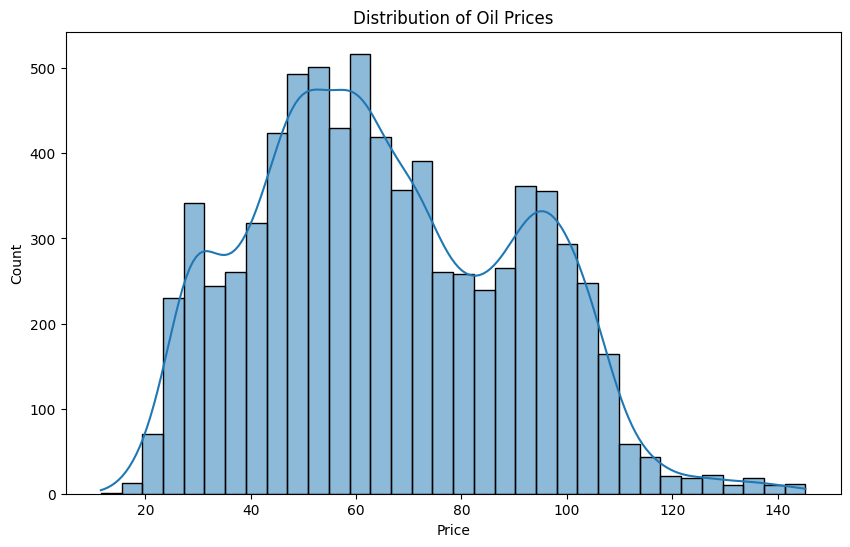

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))
sns.histplot(df['Price'], kde=True)
plt.title('Distribution of Oil Prices')
plt.show()

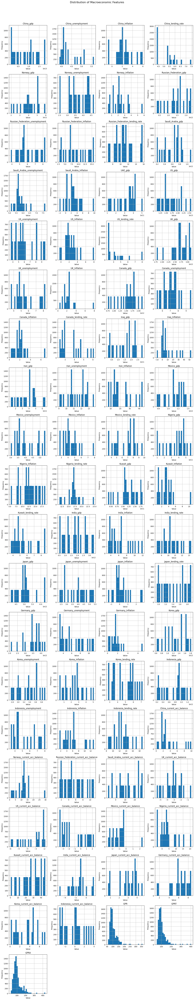

In [8]:
macro_features = ['China_gdp', 'China_unemployment', 'China_Inflation',
       'China_lending_rate', 'Norway_gdp', 'Norway_unemployment',
       'Norway_Inflation', 'Russian_Federation_gdp',
       'Russian_Federation_unemployment', 'Russian_Federation_Inflation',
       'Russian_Federation_lending_rate', 'Saudi_Arabia_gdp',
       'Saudi_Arabia_unemployment', 'Saudi_Arabia_Inflation', 'UAE_gdp',
       'US_gdp', 'US_unemployment', 'US_Inflation', 'US_lending_rate',
       'UK_gdp', 'UK_unemployment', 'UK_Inflation', 'Canada_gdp',
       'Canada_unemployment', 'Canada_Inflation', 'Canada_lending_rate',
       'Iraq_gdp', 'Iraq_Inflation', 'Iran_gdp', 'Iran_unemployment',
       'Iran_Inflation', 'Mexico_gdp', 'Mexico_unemployment',
       'Mexico_Inflation', 'Mexico_lending_rate', 'Nigeria_gdp',
       'Nigeria_Inflation', 'Nigeria_lending_rate', 'Kuwait_gdp',
       'Kuwait_Inflation', 'Kuwait_lending_rate', 'India_gdp',
       'India_Inflation', 'India_lending_rate', 'Japan_gdp',
       'Japan_unemployment', 'Japan_Inflation', 'Japan_lending_rate',
       'Germany_gdp', 'Germany_unemployment', 'Germany_Inflation', 'Korea_gdp',
       'Korea_unemployment', 'Korea_Inflation', 'Korea_lending_rate',
       'Indonesia_gdp', 'Indonesia_unemployment', 'Indonesia_Inflation',
       'Indonesia_lending_rate', 'China_current_acc_balance',
       'Norway_current_acc_balance', 'Russian_Federation_current_acc_balance',
       'Saudi_Arabia_current_acc_balance', 'UK_current_acc_balance',
       'US_current_acc_balance', 'Canada_current_acc_balance',
       'Mexico_current_acc_balance', 'Nigeria_current_acc_balance',
       'Kuwait_current_acc_balance', 'India_current_acc_balance',
       'Japan_current_acc_balance', 'Germany_current_acc_balance',
       'Korea_current_acc_balance', 'Indonesia_current_acc_balance', 'GPR',
       'GPRT', 'GPRA']


num_features = len(macro_features)
    
# Set number of rows and columns for subplots
n_cols = 4  # Number of columns in the subplot grid
n_rows = (num_features // n_cols) + (num_features % n_cols > 0)  # Calculate number of rows required

# Create the figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 4))
axes = axes.flatten()  # Flatten to easily iterate over

# Plot each macroeconomic feature
for i, feature in enumerate(macro_features):
    df[feature].hist(bins=30, ax=axes[i])
    axes[i].set_title(feature)
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

# Remove empty subplots if any
for i in range(num_features, len(axes)):
    fig.delaxes(axes[i])

# Adjust the layout and show the plot
plt.tight_layout()
plt.suptitle('Distribution of Macroeconomic Features', fontsize=16, y=1.02)
plt.show()

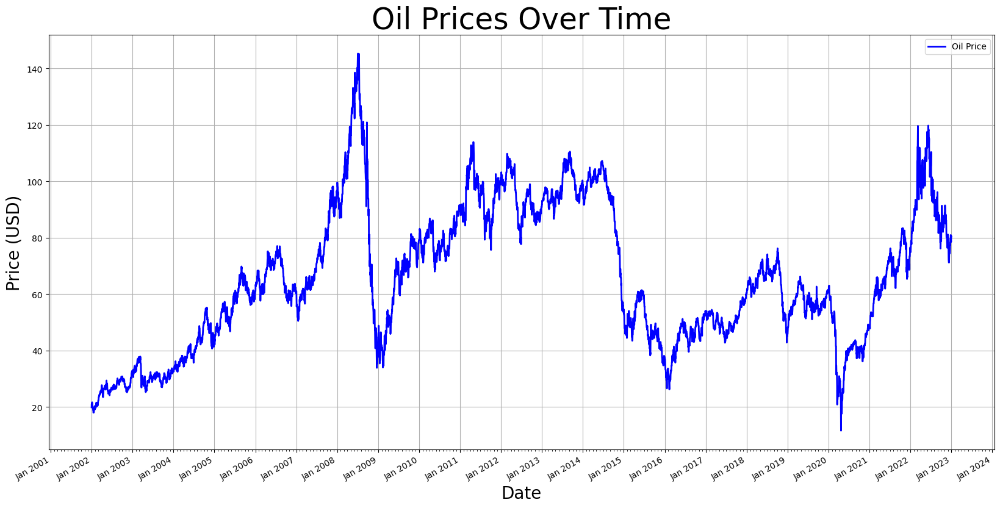

In [9]:
import pandas as pd

# Example date conversion
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')  # Specify the correct format

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Ensure the 'Date' column is in datetime format
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')  # Adjust format as needed

# Plot oil prices over time
fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(df['Date'], df['Price'], color='blue', linestyle='-', linewidth=2)

# Set x-axis to display months
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonthday=15))  # Major ticks for the middle of each month
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))  # Format as 'Month Year'

# Optional: Reduce the number of x-ticks
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # Place a tick at the start of each year
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())  # Minor ticks for each month

# Rotate and format date labels
plt.gcf().autofmt_xdate()

# Customize title and labels
plt.title("Oil Prices Over Time", fontsize=35)
plt.xlabel("Date", fontsize=20)
plt.ylabel("Price (USD)", fontsize=20)
plt.grid(True)

# Customize tick labels
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Add legend
plt.legend(['Oil Price'], fontsize=10)

# Save the figure
plt.savefig('fig_oil_prices_ts.png', dpi=300)  # Save with high resolution
plt.show()


/tmp/ipykernel_36/4127018254.py:6: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_yearly = df.resample('Y', on='Date').first()


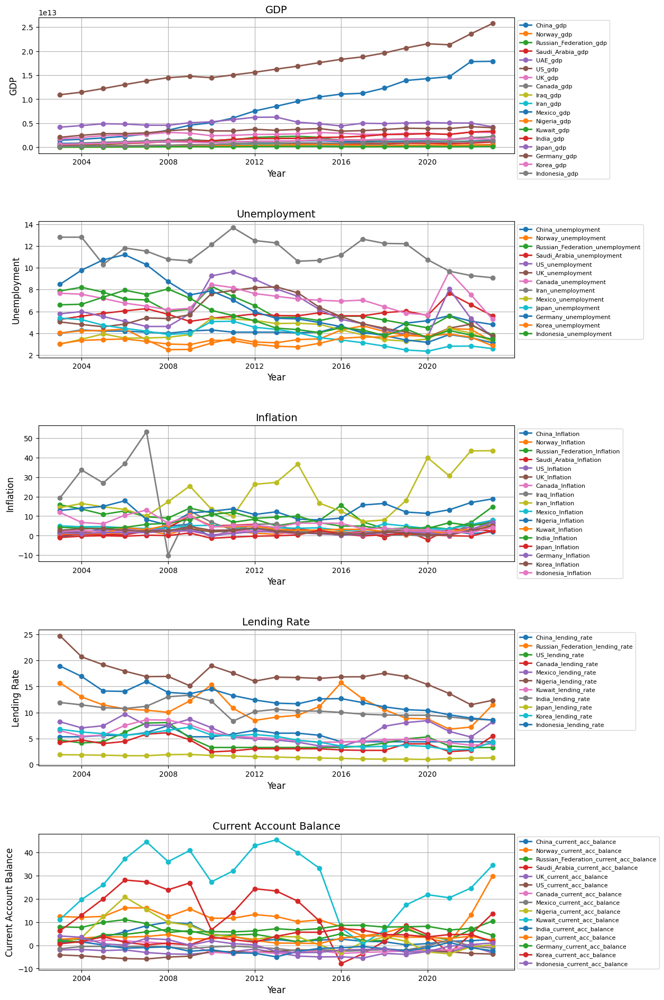

In [10]:
import math
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your DataFrame and 'Date' is already a datetime object
df_yearly = df.resample('Y', on='Date').first()

# Define macro_features and organize them into categories
gdp_columns = [col for col in df.columns if 'gdp' in col]
unemployment_columns = [col for col in df.columns if 'unemployment' in col]
inflation_columns = [col for col in df.columns if 'Inflation' in col]
lending_rate_columns = [col for col in df.columns if 'lending_rate' in col]
current_acc_balance_columns = [col for col in df.columns if 'current_acc_balance' in col]

# Define a dictionary to categorize columns
feature_dict = {
    'GDP': gdp_columns,
    'Unemployment': unemployment_columns,
    'Inflation': inflation_columns,
    'Lending Rate': lending_rate_columns,
    'Current Account Balance': current_acc_balance_columns
}

# Plot settings
num_features = len(feature_dict)
cols = 1  # Set columns to 1 to arrange plots vertically
rows = num_features  # Number of rows equals the number of features

# Increase figure size for better readability
plt.figure(figsize=(12, 4 * rows))  # Adjust height for vertical plots

for i, (feature_name, columns) in enumerate(feature_dict.items()):
    plt.subplot(rows, cols, i+1)
    for column in columns:
        plt.plot(df_yearly.index, df_yearly[column], marker='o', linewidth=2, label=column)
    
    plt.title(f'{feature_name}', fontsize=14)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel(f'{feature_name}', fontsize=12)
    plt.grid(True)
    
    # Adjust legend to avoid overlap with the plot
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=8)

# Adjust layout to prevent overlap
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.8, top=0.95, wspace=0.3, hspace=0.5)

# Show the plot
plt.show()


/tmp/ipykernel_36/1721461946.py:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_monthly = df.resample('M').mean()  # Use 'mean' to aggregate monthly; use other methods if appropriate


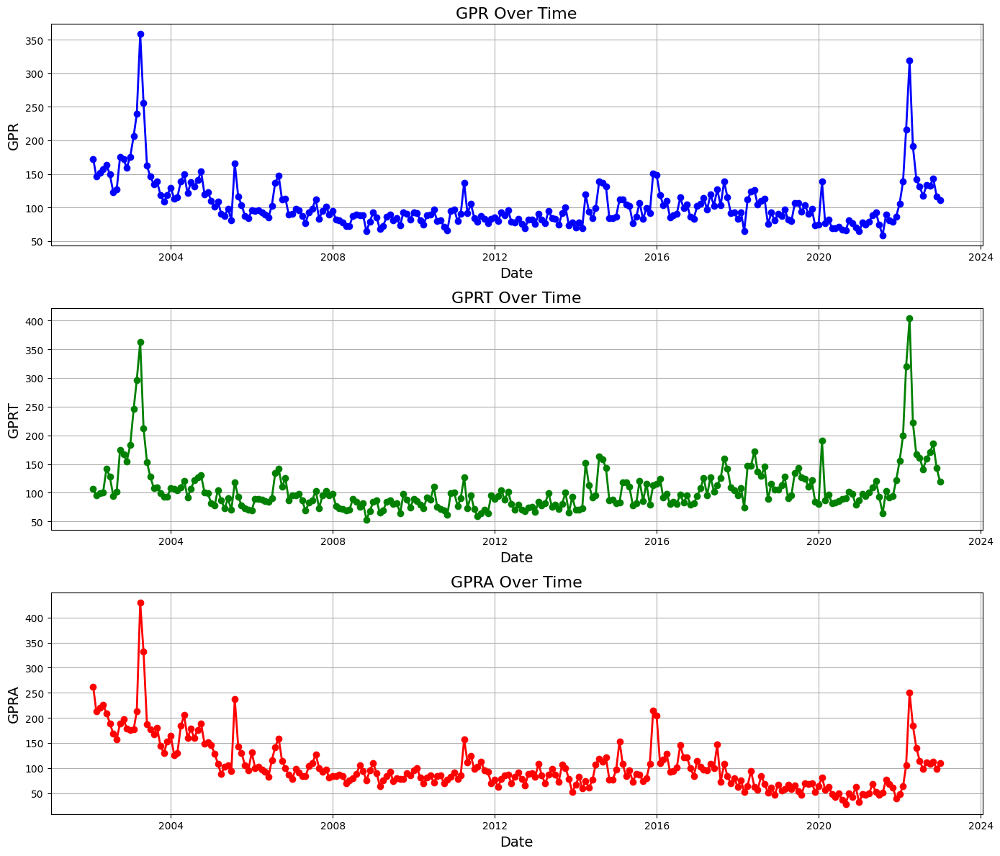

In [11]:
df.set_index('Date', inplace=True)

# Resample data to monthly frequency
df_monthly = df.resample('M').mean()  # Use 'mean' to aggregate monthly; use other methods if appropriate

# Plot the line plots for 'GPR', 'GPRT', 'GPRA'
plt.figure(figsize=(14, 12))  # Adjust the figure size as needed

# Plot GPR
plt.subplot(3, 1, 1)  # 3 rows, 1 column, 1st subplot
plt.plot(df_monthly.index, df_monthly['GPR'], marker='o', color='b', linestyle='-', linewidth=2)
plt.title('GPR Over Time', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('GPR', fontsize=14)
plt.grid(True)

# Plot GPRT
plt.subplot(3, 1, 2)  # 3 rows, 1 column, 2nd subplot
plt.plot(df_monthly.index, df_monthly['GPRT'], marker='o', color='g', linestyle='-', linewidth=2)
plt.title('GPRT Over Time', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('GPRT', fontsize=14)
plt.grid(True)

# Plot GPRA
plt.subplot(3, 1, 3)  # 3 rows, 1 column, 3rd subplot
plt.plot(df_monthly.index, df_monthly['GPRA'], marker='o', color='r', linestyle='-', linewidth=2)
plt.title('GPRA Over Time', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('GPRA', fontsize=14)
plt.grid(True)

plt.tight_layout()  # Adjust subplots to fit into the figure area

# Show the plot
plt.show()

In [13]:
df[macro_features].describe()


,China_gdp,China_unemployment,China_Inflation,China_lending_rate,Norway_gdp,Norway_unemployment,Norway_Inflation,Russian_Federation_gdp,Russian_Federation_unemployment,Russian_Federation_Inflation,...,Nigeria_current_acc_balance,Kuwait_current_acc_balance,India_current_acc_balance,Japan_current_acc_balance,Germany_current_acc_balance,Korea_current_acc_balance,Indonesia_current_acc_balance,GPR,GPRT,GPRA
count,7.670000e+03,7670.000000,7670.000000,7670.000000,7.670000e+03,7670.000000,7670.000000,7.670000e+03,7670.000000,7670.000000,...,7670.000000,7670.000000,7670.000000,7670.000000,7670.000000,7670.000000,7670.000000,7670.000000,7670.000000,7670.000000
mean,8.512077e+12,4.377175,2.330651,5.274184,4.071387e+11,3.704492,2.208437,1.457242e+12,6.113474,9.090781,...,4.103959,27.140211,-1.375691,2.975008,6.143152,3.244342,-0.130244,103.944898,105.666131,103.313923
std,5.246202e+12,0.460466,1.655235,0.863562,9.885523e+10,0.613459,1.188750,5.687019e+11,1.259236,4.076046,...,6.056518,12.992211,1.582352,1.064232,1.896176,2.073581,2.193774,36.721569,43.287745,50.140161
min,1.470558e+12,3.900000,-0.731971,4.350000,1.959149e+11,2.493000,0.454499,3.454705e+11,3.867000,2.878297,...,-3.698743,0.586533,-5.004890,0.742322,1.438469,0.167377,-3.189965,58.420769,53.117390,28.454628
25%,3.550328e+12,4.100000,1.593136,4.350000,3.676334e+11,3.231000,1.286725,1.222646e+12,5.212000,6.694459,...,0.215520,19.685043,-2.426975,2.602565,5.693858,1.327562,-2.035042,82.101761,81.273224,74.028297
50%,8.532185e+12,4.200000,2.000002,5.310000,4.026433e+11,3.684000,2.167730,1.524917e+12,5.589000,8.440465,...,3.237197,27.340341,-1.253504,3.083939,6.567299,3.613617,0.097088,92.597801,94.939980,90.955673
75%,1.231049e+13,4.650000,2.899234,5.810000,5.013605e+11,4.256000,2.487826,1.843392e+12,7.124000,12.685304,...,4.701382,37.216656,-0.663718,3.795862,7.294130,4.635087,1.001848,115.075974,115.885185,114.770668
max,1.788178e+13,5.610000,5.925251,7.470000,5.937270e+11,4.680000,5.764123,2.292470e+12,8.301000,15.788731,...,20.794045,45.459992,1.443558,4.623300,8.615881,7.170246,3.998527,358.711182,403.713623,429.144196


/tmp/ipykernel_36/3921224692.py:1: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_yearly = df.resample('Y', on='Date').first()


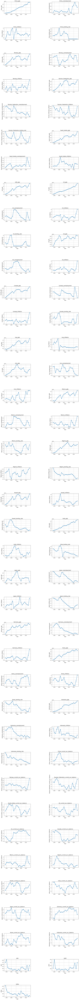

In [14]:
df_yearly = df.resample('Y', on='Date').first()  
import math
import matplotlib.pyplot as plt
import pandas as pd

num_plots = len(macro_features)
cols = 2  
rows = math.ceil(num_plots / cols)  


plt.figure(figsize=(15, 200))  

for i, feature in enumerate(macro_features):
    plt.subplot(rows, cols, i+1) 
    plt.plot(df_yearly.index, df_yearly[feature], marker='o', linewidth=2)
    plt.title(f'{feature}', fontsize=14)  
    plt.xlabel('Year', fontsize=12)
    plt.ylabel(f'{feature}', fontsize=12)
    plt.grid(True)


plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.8, hspace=1.2)

# Show the plot
plt.show()

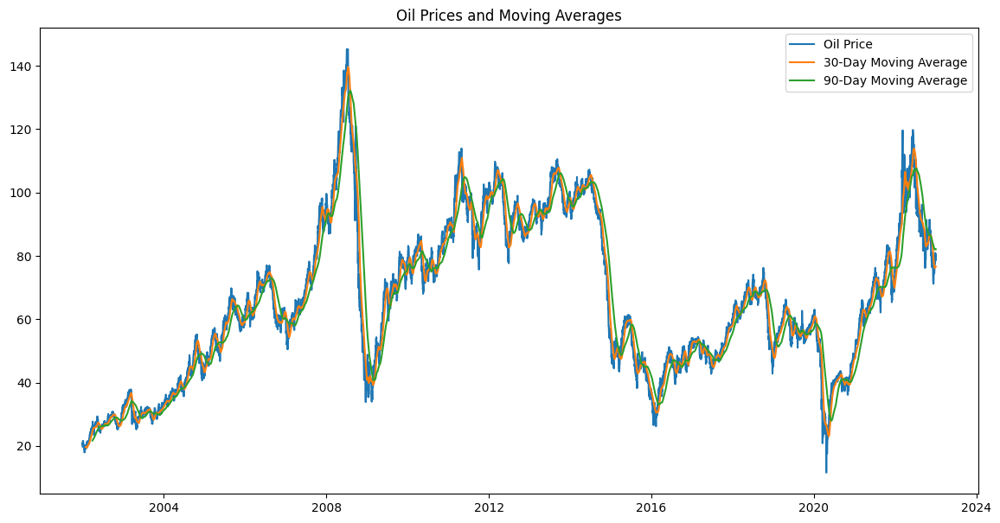

In [11]:
# Create rolling averages for oil prices
df['Price_MA_30'] = df['Price'].rolling(window=30).mean()
df['Price_MA_90'] = df['Price'].rolling(window=90).mean()

# Plot rolling averages vs actual prices
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Price'], label='Oil Price')
plt.plot(df['Date'], df['Price_MA_30'], label='30-Day Moving Average')
plt.plot(df['Date'], df['Price_MA_90'], label='90-Day Moving Average')
plt.legend()
plt.title('Oil Prices and Moving Averages')
plt.show()


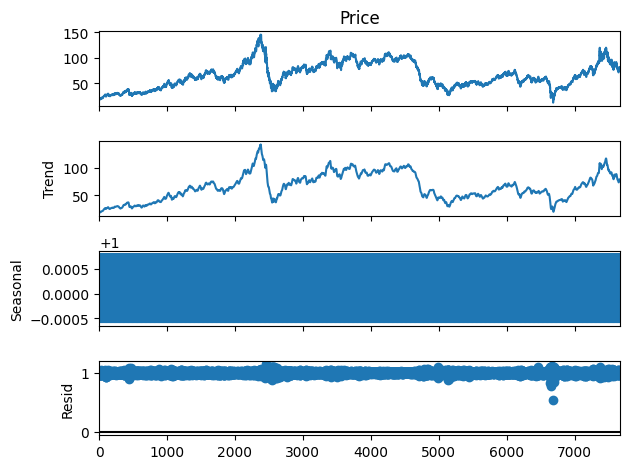

In [12]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(df['Price'], model='multiplicative', period=12)
result.plot()
plt.show()

In [13]:
# Adding oil price data to the macro features list for correlation analysis
all_features = macro_features + ['Price']

# Compute the correlation matrix
correlation_matrix = df[all_features].corr()

# Visualize the correlation matrix
import seaborn as sns
plt.figure(figsize=(200, 80))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of Macroeconomic Indicators and Oil Prices")
plt.show()


In [14]:
# Creating lag features for 'Price'
df['Price_lag1'] = df['Price'].shift(1)
df['Price_lag2'] = df['Price'].shift(2)

# Creating rolling average features for 'Price'
df['Price_rolling_mean'] = df['Price'].rolling(window=3).mean()

# Drop rows with NaN values created due to lag or rolling features
df.dropna(inplace=True)


In [15]:
import matplotlib.pyplot as plt

In [16]:
df.columns

Index(['Date', 'China_gdp', 'China_unemployment', 'China_Inflation',
       'China_lending_rate', 'Norway_gdp', 'Norway_unemployment',
       'Norway_Inflation', 'Russian_Federation_gdp',
       'Russian_Federation_unemployment', 'Russian_Federation_Inflation',
       'Russian_Federation_lending_rate', 'Saudi_Arabia_gdp',
       'Saudi_Arabia_unemployment', 'Saudi_Arabia_Inflation', 'UAE_gdp',
       'US_gdp', 'US_unemployment', 'US_Inflation', 'US_lending_rate',
       'UK_gdp', 'UK_unemployment', 'UK_Inflation', 'Canada_gdp',
       'Canada_unemployment', 'Canada_Inflation', 'Canada_lending_rate',
       'Iraq_gdp', 'Iraq_Inflation', 'Iran_gdp', 'Iran_unemployment',
       'Iran_Inflation', 'Mexico_gdp', 'Mexico_unemployment',
       'Mexico_Inflation', 'Mexico_lending_rate', 'Nigeria_gdp',
       'Nigeria_Inflation', 'Nigeria_lending_rate', 'Kuwait_gdp',
       'Kuwait_Inflation', 'Kuwait_lending_rate', 'India_gdp',
       'India_Inflation', 'India_lending_rate', 'Japan_gdp',
      

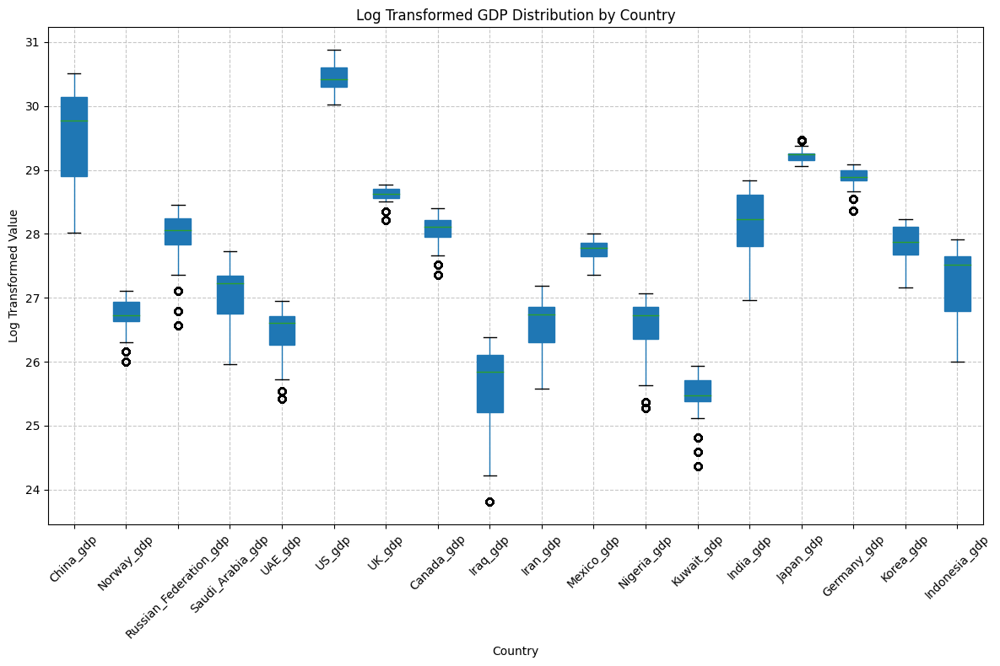

In [21]:
gdp_columns = [col for col in df.columns if 'gdp' in col]

# Apply log transformation to GDP values for better visualization
df_gdp_log = df[gdp_columns].apply(lambda x: np.log1p(x))

# Function to create box plot for a given set of columns with log transformation
def create_box_plot(df, columns, title, filename):
    plt.figure(figsize=(12, 8))
    df[columns].boxplot(grid=True, patch_artist=True, showfliers=True)
    plt.title(title)
    plt.xlabel('Country')
    plt.ylabel('Log Transformed Value')
    plt.xticks(rotation=45)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(filename)
    plt.show()

# Create box plot for GDP with log transformation
create_box_plot(df_gdp_log, gdp_columns, 'Log Transformed GDP Distribution by Country', 'log_gdp_box_plot.png')

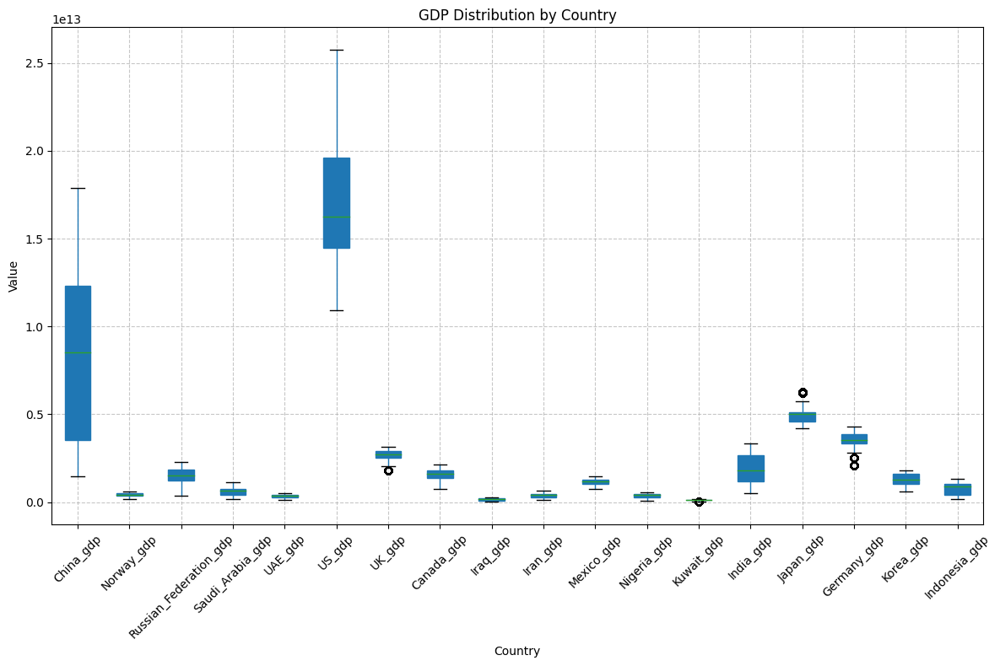

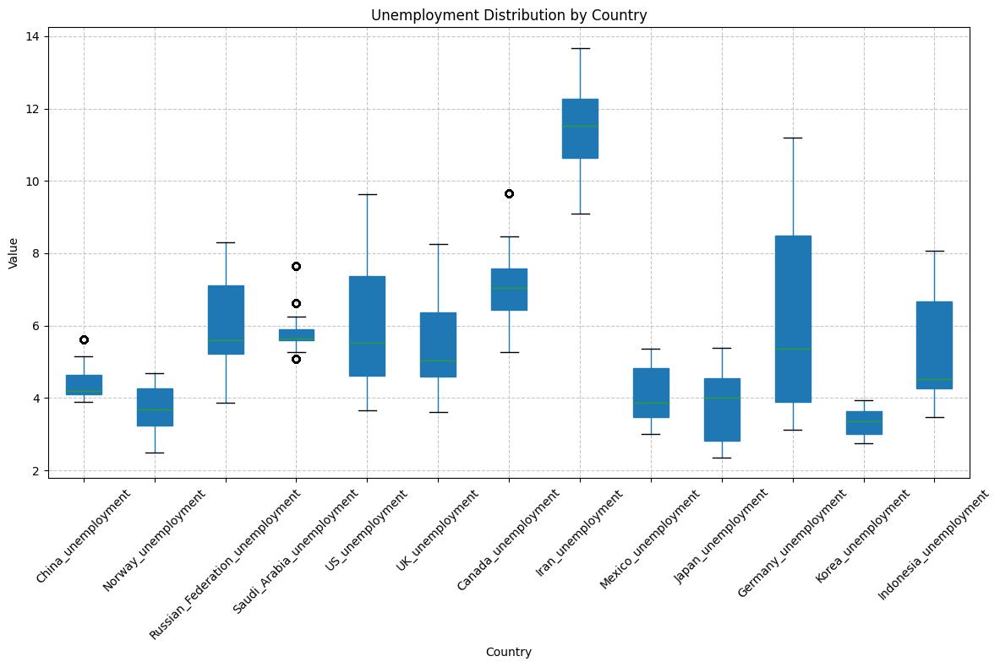

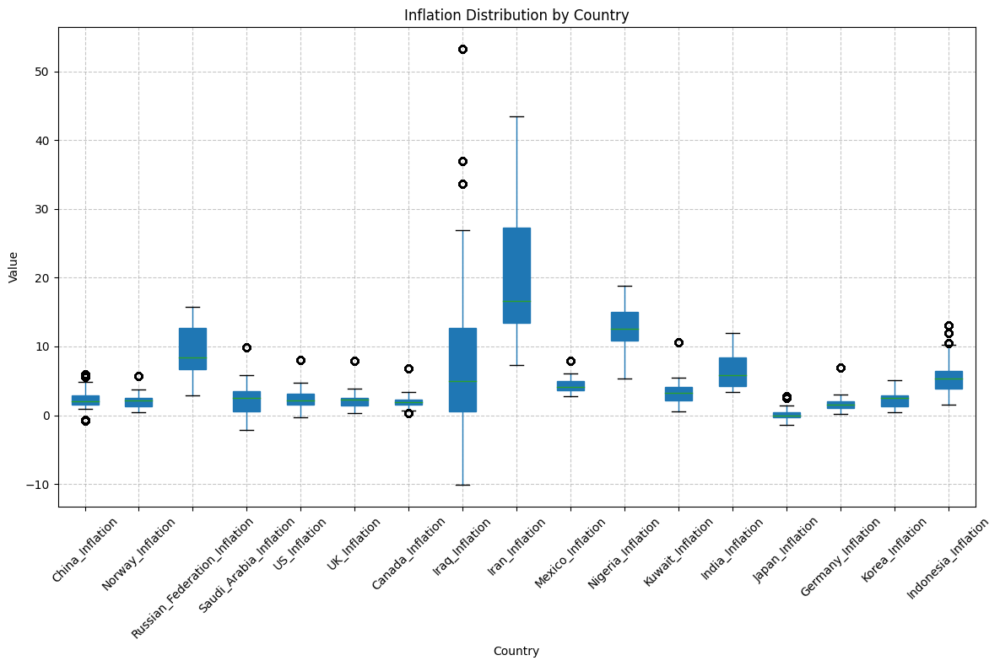

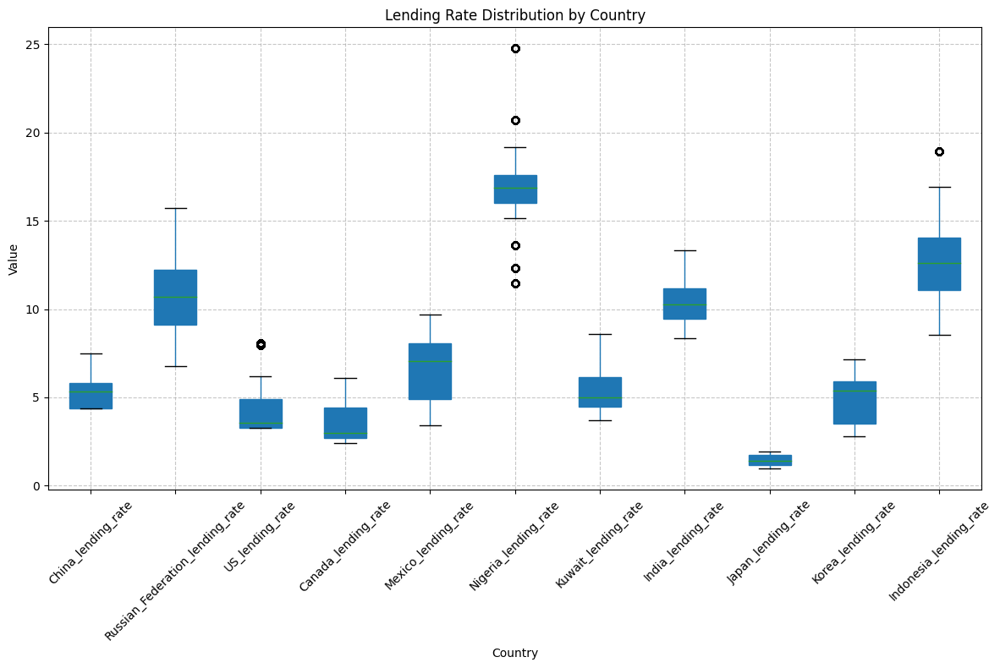

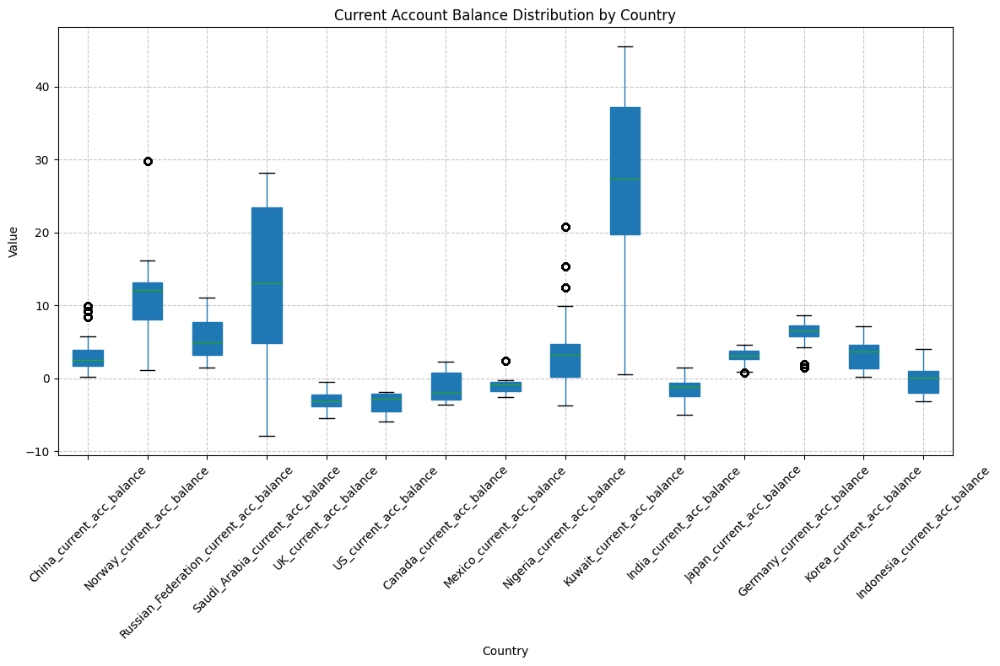

In [22]:
gdp_columns = [col for col in df.columns if 'gdp' in col]
unemployment_columns = [col for col in df.columns if 'unemployment' in col]
inflation_columns = [col for col in df.columns if 'Inflation' in col]
lending_rate_columns = [col for col in df.columns if 'lending_rate' in col]
current_acc_balance_columns = [col for col in df.columns if 'current_acc_balance' in col]

# Function to create box plot for a given set of columns
def create_box_plot(df, columns, title, filename):
    plt.figure(figsize=(12, 8))
    df[columns].boxplot(grid=True, patch_artist=True, showfliers=True)
    plt.title(title)
    plt.xlabel('Country')
    plt.ylabel('Value')
    plt.xticks(rotation=45)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(filename)
    plt.show()

# Create box plots for each category
create_box_plot(df, gdp_columns, 'GDP Distribution by Country', 'gdp_box_plot.png')
create_box_plot(df, unemployment_columns, 'Unemployment Distribution by Country', 'unemployment_box_plot.png')
create_box_plot(df, inflation_columns, 'Inflation Distribution by Country', 'inflation_box_plot.png')
create_box_plot(df, lending_rate_columns, 'Lending Rate Distribution by Country', 'lending_rate_box_plot.png')
create_box_plot(df, current_acc_balance_columns, 'Current Account Balance Distribution by Country', 'current_acc_balance_box_plot.png')

In [17]:
from sklearn.model_selection import train_test_split

# Define feature columns and target column
features = df.drop(['Date', 'Price'], axis=1)  # Exclude non-numeric columns
target = df['Price']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, shuffle=False)


In [18]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# Scale the features
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


Random Forest MSE: 451.55503989053426


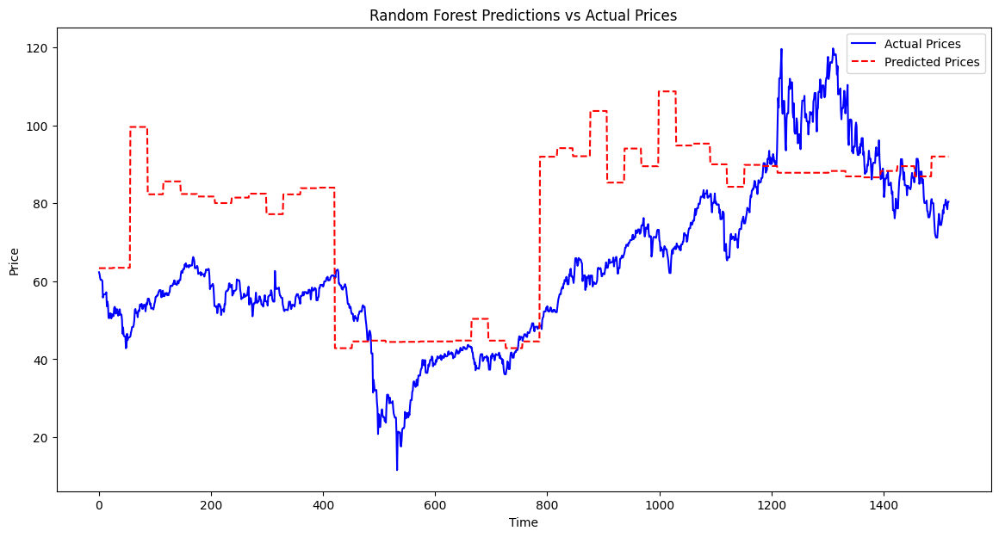

Random Forest Feature ranking:
1. feature Norway_gdp (0.6332)
2. feature India_current_acc_balance (0.0875)
3. feature GPR (0.0609)
4. feature Nigeria_lending_rate (0.0320)
5. feature GPRT (0.0286)
6. feature GPRA (0.0266)
7. feature Japan_current_acc_balance (0.0249)
8. feature Kuwait_gdp (0.0129)
9. feature Russian_Federation_gdp (0.0129)
10. feature Korea_unemployment (0.0041)
11. feature India_lending_rate (0.0034)
12. feature Kuwait_Inflation (0.0027)
13. feature Korea_lending_rate (0.0026)
14. feature India_Inflation (0.0023)
15. feature Saudi_Arabia_Inflation (0.0023)
16. feature Russian_Federation_Inflation (0.0022)
17. feature Indonesia_lending_rate (0.0022)
18. feature Russian_Federation_lending_rate (0.0021)
19. feature Iraq_Inflation (0.0020)
20. feature Indonesia_current_acc_balance (0.0020)
21. feature Indonesia_Inflation (0.0019)
22. feature Norway_Inflation (0.0018)
23. feature India_gdp (0.0016)
24. feature Iraq_gdp (0.0016)
25. feature Norway_unemployment (0.0016)
26.

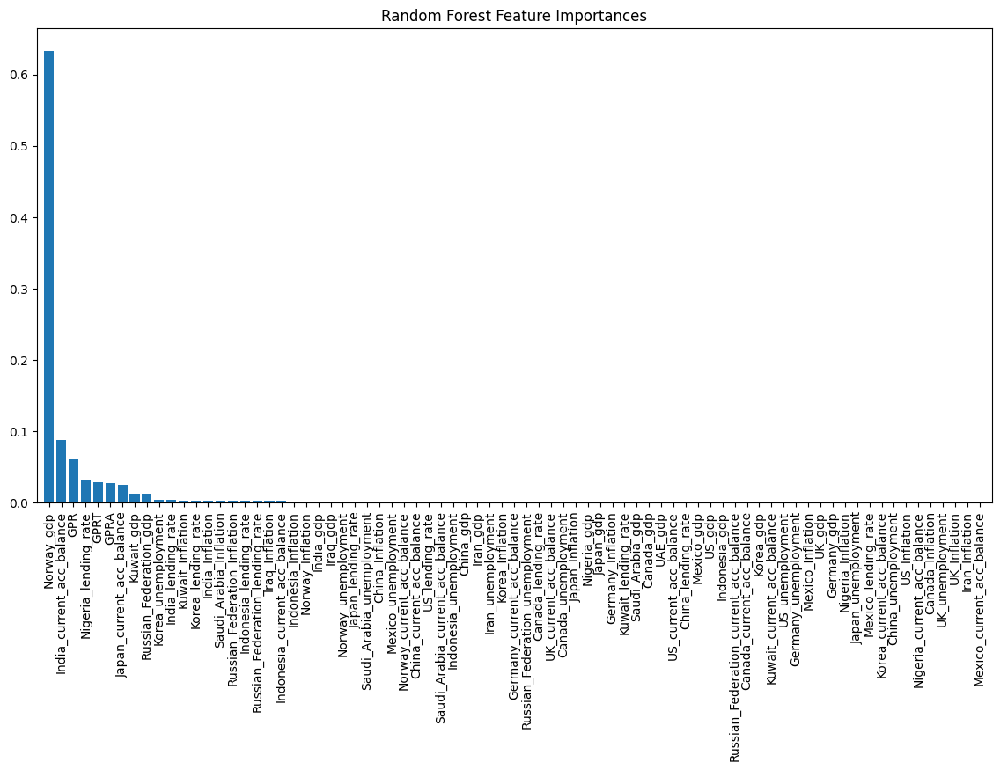

Gradient Boosting MSE: 316.00291101712116


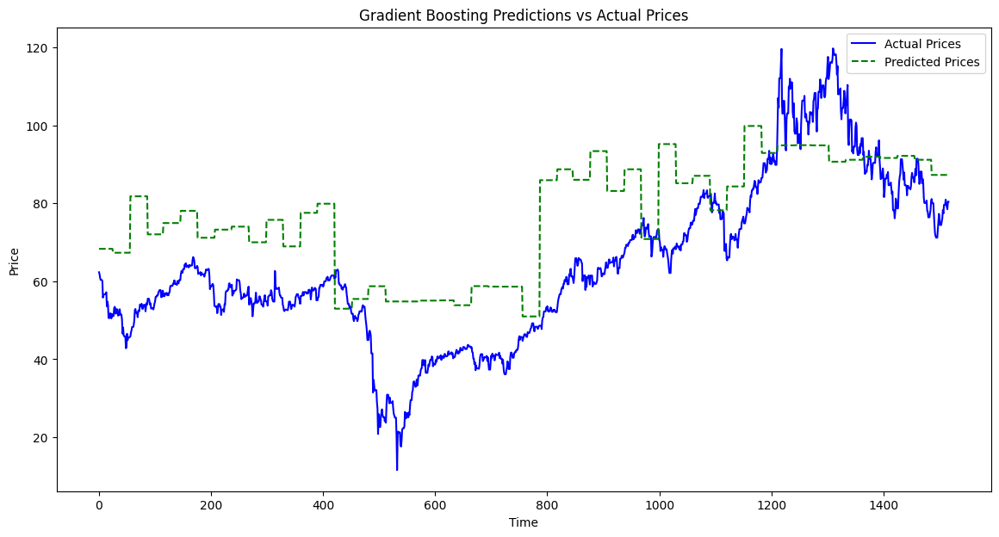

Gradient Boosting Feature ranking:
1. feature Norway_gdp (0.5669)
2. feature India_current_acc_balance (0.0637)
3. feature GPR (0.0528)
4. feature India_Inflation (0.0411)
5. feature GPRT (0.0367)
6. feature Norway_unemployment (0.0352)
7. feature Nigeria_lending_rate (0.0258)
8. feature GPRA (0.0250)
9. feature Saudi_Arabia_Inflation (0.0249)
10. feature Russian_Federation_gdp (0.0168)
11. feature UK_Inflation (0.0123)
12. feature Japan_current_acc_balance (0.0117)
13. feature Kuwait_gdp (0.0086)
14. feature Kuwait_current_acc_balance (0.0070)
15. feature Korea_unemployment (0.0052)
16. feature Germany_gdp (0.0051)
17. feature Iran_Inflation (0.0049)
18. feature Saudi_Arabia_unemployment (0.0041)
19. feature China_Inflation (0.0037)
20. feature Japan_unemployment (0.0030)
21. feature Nigeria_gdp (0.0030)
22. feature Japan_lending_rate (0.0028)
23. feature US_gdp (0.0027)
24. feature Canada_unemployment (0.0027)
25. feature Germany_Inflation (0.0026)
26. feature Iran_unemployment (0.00

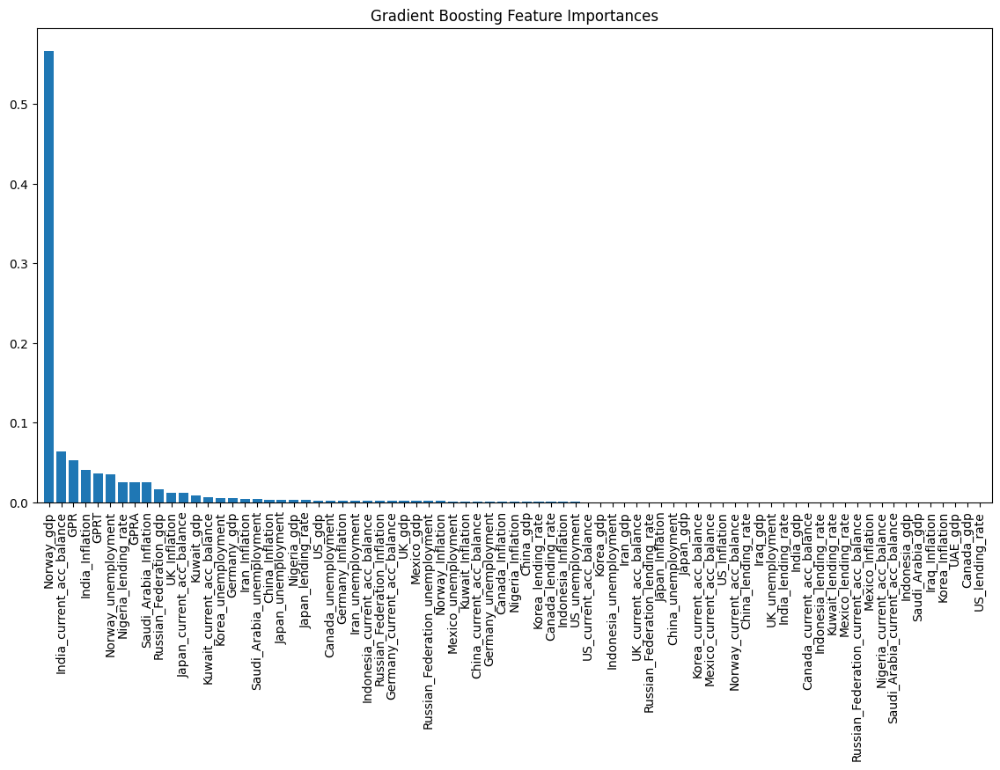

XGBoost MSE: 362.0546463307175


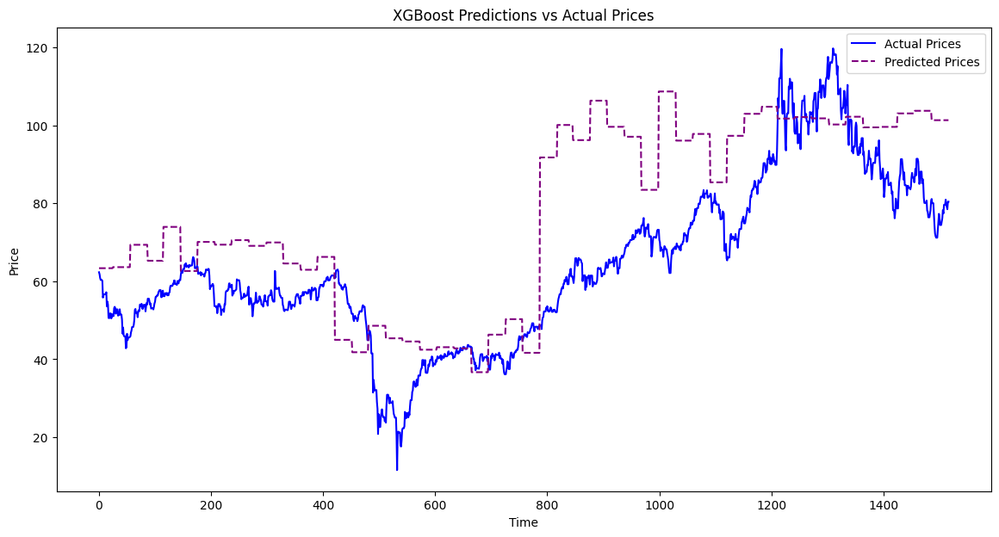

XGBoost Feature ranking:
1. feature Norway_gdp (0.5746)
2. feature India_current_acc_balance (0.3523)
3. feature UK_Inflation (0.0195)
4. feature Norway_unemployment (0.0143)
5. feature Russian_Federation_unemployment (0.0096)
6. feature Mexico_unemployment (0.0048)
7. feature China_lending_rate (0.0045)
8. feature India_Inflation (0.0042)
9. feature China_gdp (0.0032)
10. feature Iran_Inflation (0.0025)
11. feature GPR (0.0020)
12. feature GPRA (0.0015)
13. feature Japan_gdp (0.0014)
14. feature GPRT (0.0013)
15. feature China_current_acc_balance (0.0010)
16. feature Iran_unemployment (0.0005)
17. feature Norway_Inflation (0.0004)
18. feature Korea_unemployment (0.0004)
19. feature Canada_unemployment (0.0003)
20. feature Germany_current_acc_balance (0.0003)
21. feature Russian_Federation_Inflation (0.0002)
22. feature Mexico_gdp (0.0002)
23. feature China_Inflation (0.0002)
24. feature Mexico_lending_rate (0.0001)
25. feature Russian_Federation_current_acc_balance (0.0001)
26. featur

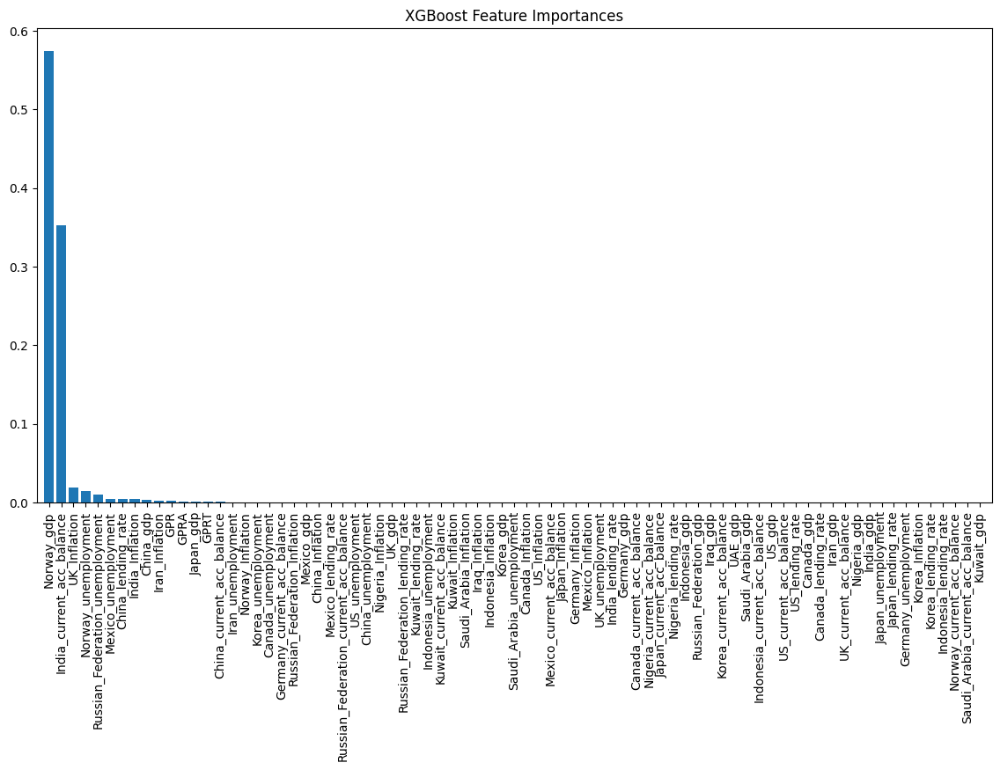

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import xgboost as xgb

# Sample Data Preparation (assuming df is your dataframe and 'Price' is the target variable)
# Replace 'macro_features' with your actual feature columns
macro_features = ['China_gdp', 'China_unemployment', 'China_Inflation',
       'China_lending_rate', 'Norway_gdp', 'Norway_unemployment',
       'Norway_Inflation', 'Russian_Federation_gdp',
       'Russian_Federation_unemployment', 'Russian_Federation_Inflation',
       'Russian_Federation_lending_rate', 'Saudi_Arabia_gdp',
       'Saudi_Arabia_unemployment', 'Saudi_Arabia_Inflation', 'UAE_gdp',
       'US_gdp', 'US_unemployment', 'US_Inflation', 'US_lending_rate',
       'UK_gdp', 'UK_unemployment', 'UK_Inflation', 'Canada_gdp',
       'Canada_unemployment', 'Canada_Inflation', 'Canada_lending_rate',
       'Iraq_gdp', 'Iraq_Inflation', 'Iran_gdp', 'Iran_unemployment',
       'Iran_Inflation', 'Mexico_gdp', 'Mexico_unemployment',
       'Mexico_Inflation', 'Mexico_lending_rate', 'Nigeria_gdp',
       'Nigeria_Inflation', 'Nigeria_lending_rate', 'Kuwait_gdp',
       'Kuwait_Inflation', 'Kuwait_lending_rate', 'India_gdp',
       'India_Inflation', 'India_lending_rate', 'Japan_gdp',
       'Japan_unemployment', 'Japan_Inflation', 'Japan_lending_rate',
       'Germany_gdp', 'Germany_unemployment', 'Germany_Inflation', 'Korea_gdp',
       'Korea_unemployment', 'Korea_Inflation', 'Korea_lending_rate',
       'Indonesia_gdp', 'Indonesia_unemployment', 'Indonesia_Inflation',
       'Indonesia_lending_rate', 'China_current_acc_balance',
       'Norway_current_acc_balance', 'Russian_Federation_current_acc_balance',
       'Saudi_Arabia_current_acc_balance', 'UK_current_acc_balance',
       'US_current_acc_balance', 'Canada_current_acc_balance',
       'Mexico_current_acc_balance', 'Nigeria_current_acc_balance',
       'Kuwait_current_acc_balance', 'India_current_acc_balance',
       'Japan_current_acc_balance', 'Germany_current_acc_balance',
       'Korea_current_acc_balance', 'Indonesia_current_acc_balance', 'GPR',
       'GPRT', 'GPRA']

X = df[macro_features].values
y = df['Price'].values

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# 1. Random Forest
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_predictions = rf_model.predict(X_test)
rf_mse = mean_squared_error(y_test, rf_predictions)
print(f"Random Forest MSE: {rf_mse}")

# Plotting actual vs predicted prices for Random Forest
plt.figure(figsize=(14, 7))
plt.plot(y_test, color='blue', label='Actual Prices')
plt.plot(rf_predictions, color='red', linestyle='--', label='Predicted Prices')
plt.title('Random Forest Predictions vs Actual Prices')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Feature Importances for Random Forest
importances_rf = rf_model.feature_importances_
indices_rf = np.argsort(importances_rf)[::-1]

# Print feature ranking for Random Forest
print("Random Forest Feature ranking:")
for f in range(X_train.shape[1]):
    print(f"{f + 1}. feature {macro_features[indices_rf[f]]} ({importances_rf[indices_rf[f]]:.4f})")

# Plot Feature Importances for Random Forest
plt.figure(figsize=(14, 7))
plt.title('Random Forest Feature Importances')
plt.bar(range(X_train.shape[1]), importances_rf[indices_rf], align='center')
plt.xticks(range(X_train.shape[1]), np.array(macro_features)[indices_rf], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()

# 2. Gradient Boosting
gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)
gb_model.fit(X_train, y_train)
gb_predictions = gb_model.predict(X_test)
gb_mse = mean_squared_error(y_test, gb_predictions)
print(f"Gradient Boosting MSE: {gb_mse}")

# Plotting actual vs predicted prices for Gradient Boosting
plt.figure(figsize=(14, 7))
plt.plot(y_test, color='blue', label='Actual Prices')
plt.plot(gb_predictions, color='green', linestyle='--', label='Predicted Prices')
plt.title('Gradient Boosting Predictions vs Actual Prices')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Feature Importances for Gradient Boosting
importances_gb = gb_model.feature_importances_
indices_gb = np.argsort(importances_gb)[::-1]

# Print feature ranking for Gradient Boosting
print("Gradient Boosting Feature ranking:")
for f in range(X_train.shape[1]):
    print(f"{f + 1}. feature {macro_features[indices_gb[f]]} ({importances_gb[indices_gb[f]]:.4f})")

# Plot Feature Importances for Gradient Boosting
plt.figure(figsize=(14, 7))
plt.title('Gradient Boosting Feature Importances')
plt.bar(range(X_train.shape[1]), importances_gb[indices_gb], align='center')
plt.xticks(range(X_train.shape[1]), np.array(macro_features)[indices_gb], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()

# 3. XGBoost
xgb_model = xgb.XGBRegressor(n_estimators=100, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_predictions = xgb_model.predict(X_test)
xgb_mse = mean_squared_error(y_test, xgb_predictions)
print(f"XGBoost MSE: {xgb_mse}")

# Plotting actual vs predicted prices for XGBoost
plt.figure(figsize=(14, 7))
plt.plot(y_test, color='blue', label='Actual Prices')
plt.plot(xgb_predictions, color='purple', linestyle='--', label='Predicted Prices')
plt.title('XGBoost Predictions vs Actual Prices')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

# Feature Importances for XGBoost
importances_xgb = xgb_model.feature_importances_
indices_xgb = np.argsort(importances_xgb)[::-1]

# Print feature ranking for XGBoost
print("XGBoost Feature ranking:")
for f in range(X_train.shape[1]):
    print(f"{f + 1}. feature {macro_features[indices_xgb[f]]} ({importances_xgb[indices_xgb[f]]:.4f})")

# Plot Feature Importances for XGBoost
plt.figure(figsize=(14, 7))
plt.title('XGBoost Feature Importances')
plt.bar(range(X_train.shape[1]), importances_xgb[indices_xgb], align='center')
plt.xticks(range(X_train.shape[1]), np.array(macro_features)[indices_xgb], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()


In [20]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

# Define parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize model
rf = RandomForestRegressor(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Score: {best_score}")


Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   3.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   7.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   9.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=  10.3s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   6.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   8.9s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   3.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   3.0s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   6.8s
[CV] END max_depth=10, min

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Number of samples to visualize
num_samples_to_plot = 5  # Adjust as needed

# Plot y_test values
plt.figure(figsize=(14, 7))

# Generate time steps for the x-axis
time_steps = np.arange(len(y_test))

# Plot the y_test values
plt.plot(time_steps, y_test, label='y_test Actual Values', color='blue', linestyle='-', marker='o')



plt.title('y_test Values and Corresponding X_test Sequences')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.legend(loc='best')
plt.grid(True)
plt.show()


/opt/conda/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step - loss: 0.0249 - val_loss: 2.1157e-04
Epoch 2/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.0018 - val_loss: 2.2865e-04
Epoch 3/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.0014 - val_loss: 2.7883e-04
Epoch 4/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.0012 - val_loss: 2.2024e-04
Epoch 5/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.0010 - val_loss: 3.7478e-04
Epoch 6/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 9.3931e-04 - val_loss: 1.6773e-04
Epoch 7/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - loss: 7.3562e-04 - val_loss: 1.7328e-04
Epoch 8/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - loss: 7.8823e-04 - val_loss: 1.4539e-04
Epoch 9/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 6.5176e-04 - val_loss: 3.6846e-04
Epoch 10/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 6.7094e-04 - val_loss: 1.6496e-04
Epoch 11/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - 

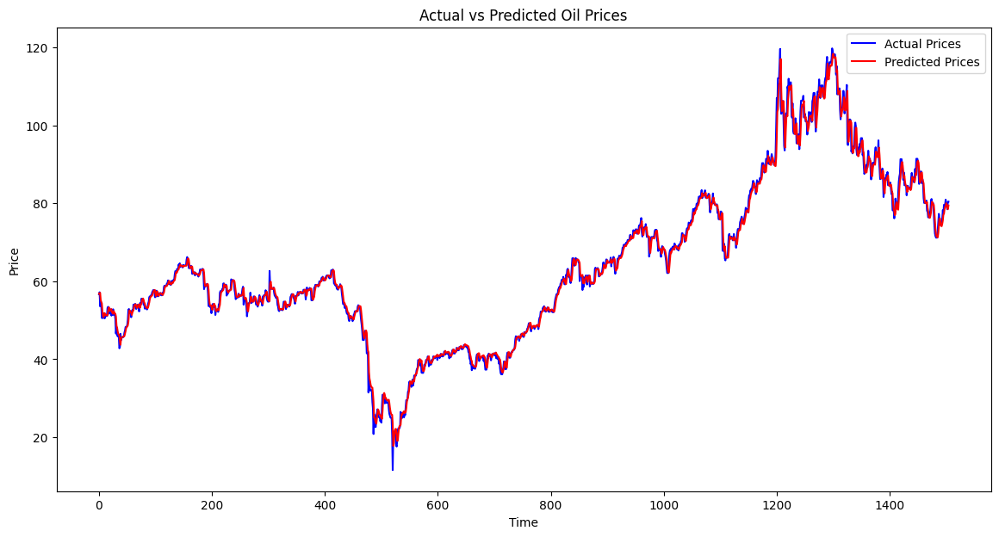

In [27]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

# Assuming df is the original DataFrame
data = df[['Price']]  

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Function to create sequences from time series data
def create_sequences(data, lookback):
    X, y = [], []
    for i in range(lookback, len(data)):
        X.append(data[i-lookback:i, 0])  # past 'lookback' days of data
        y.append(data[i, 0])  # target variable
    return np.array(X), np.array(y)

lookback = 60  # Number of time steps to look back
X, y = create_sequences(scaled_data, lookback)

# Reshape X to [samples, time steps, features]
X = np.reshape(X, (X.shape[0], X.shape[1], 1))

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Build LSTM Model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(Dropout(0.2))
model.add(LSTM(units=50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(units=25))
model.add(Dense(units=1))

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Early stopping to prevent overfitting
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, callbacks=[early_stop])

# Evaluate the model
train_loss = model.evaluate(X_train, y_train)
test_loss = model.evaluate(X_test, y_test)
print(f"Train Loss: {train_loss}, Test Loss: {test_loss}")

# Predictions
predicted_prices = model.predict(X_test)

# Invert scaling to get actual prices
predicted_prices = scaler.inverse_transform(predicted_prices.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calculate Evaluation Metrics
mse = mean_squared_error(y_test_actual, predicted_prices)
mae = mean_absolute_error(y_test_actual, predicted_prices)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test_actual, predicted_prices)
r2 = r2_score(y_test_actual, predicted_prices)

# Print Evaluation Metrics
print(f"LSTM MSE: {mse}")
print(f"LSTM MAE: {mae}")
print(f"LSTM RMSE: {rmse}")
print(f"LSTM MAPE: {mape}")
print(f"LSTM R²: {r2}")

# Plotting actual vs predicted prices
plt.figure(figsize=(14,7))
plt.plot(y_test_actual, color='blue', label='Actual Prices')
plt.plot(predicted_prices, color='red', label='Predicted Prices')
plt.title('Actual vs Predicted Oil Prices')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()





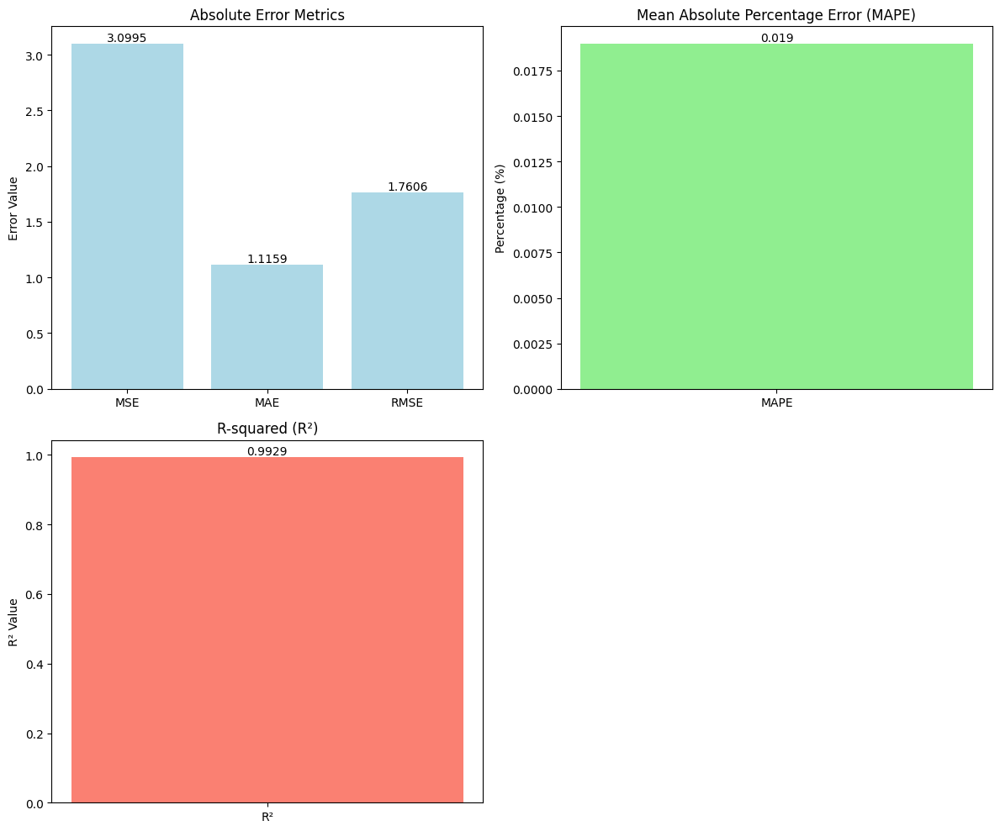

In [28]:
import matplotlib.pyplot as plt

# Define the metrics and values
metrics = ['MSE', 'MAE', 'RMSE', 'MAPE', 'R²']
values = [mse, mae, rmse, mape, r2]

# Create subplots for different types of metrics
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot Absolute Error Metrics (MSE, MAE, RMSE)
bars = axs[0, 0].bar(['MSE', 'MAE', 'RMSE'], [mse, mae, rmse], color='lightblue')
axs[0, 0].set_title('Absolute Error Metrics')
axs[0, 0].set_ylabel('Error Value')

# Add values inside the bars for Absolute Error Metrics
for bar in bars:
    yval = bar.get_height()
    axs[0, 0].text(bar.get_x() + bar.get_width()/2, yval, round(yval, 4), ha='center', va='bottom')

# Plot MAPE (Percentage Error)
bar_mape = axs[0, 1].bar(['MAPE'], [mape], color='lightgreen')
axs[0, 1].set_title('Mean Absolute Percentage Error (MAPE)')
axs[0, 1].set_ylabel('Percentage (%)')

# Add value inside the bar for MAPE
for bar in bar_mape:
    yval = bar.get_height()
    axs[0, 1].text(bar.get_x() + bar.get_width()/2, yval, round(yval, 4), ha='center', va='bottom')

# Plot R-squared (R²)
bar_r2 = axs[1, 0].bar(['R²'], [r2], color='salmon')
axs[1, 0].set_title('R-squared (R²)')
axs[1, 0].set_ylabel('R² Value')

# Add value inside the bar for R²
for bar in bar_r2:
    yval = bar.get_height()
    axs[1, 0].text(bar.get_x() + bar.get_width()/2, yval, round(yval, 4), ha='center', va='bottom')

# Hide the empty subplot
axs[1, 1].axis('off')

# Adjust layout for better visualization
plt.tight_layout()
plt.show()


In [11]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

data = df[['Price']]  

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Function to create sequences from time series data
def create_sequences(data, lookback):
    X, y = [], []
    for i in range(lookback, len(data)):
        X.append(data[i-lookback:i, 0])  # past 'lookback' days of data
        y.append(data[i, 0])  # target variable
    return np.array(X), np.array(y)

lookback = 60  # Number of time steps to look back
X, y = create_sequences(scaled_data, lookback)

# Reshape X to [samples, time steps, features]
X = np.reshape(X, (X.shape[0], X.shape[1], 1))

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Build LSTM Model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(Dropout(0.2))
model.add(LSTM(units=50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(units=25))
model.add(Dense(units=1))

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Early stopping to prevent overfitting
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, callbacks=[early_stop])

# Evaluate the model
train_loss = model.evaluate(X_train, y_train)
test_loss = model.evaluate(X_test, y_test)
print(f"Train Loss: {train_loss}, Test Loss: {test_loss}")

# Predictions
predicted_prices = model.predict(X_test)

# Invert scaling to get actual prices
predicted_prices = scaler.inverse_transform(predicted_prices.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

# Model Performance (MSE)
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test_actual, predicted_prices)
print(f"LSTM MSE: {mse}")

# Plotting actual vs predicted prices
import matplotlib.pyplot as plt

plt.figure(figsize=(14,7))
plt.plot(y_test_actual, color='blue', label='Actual Prices')
plt.plot(predicted_prices, color='red', label='Predicted Prices')
plt.title('Actual vs Predicted Oil Prices')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 66/153 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0593

KeyboardInterrupt: 

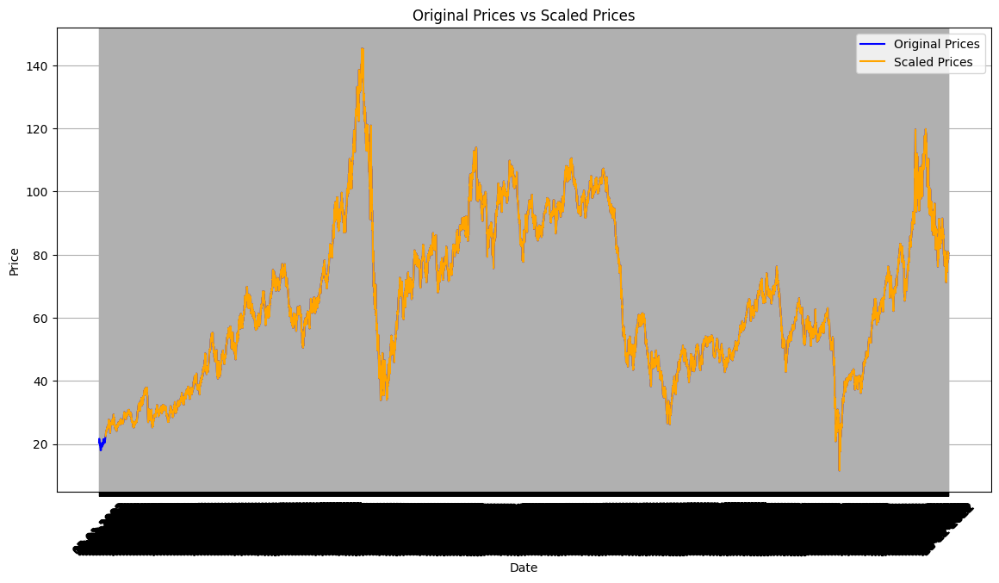

In [18]:
import matplotlib.pyplot as plt

# After scaling
scaled_prices = scaler.transform(data)  # scaled_data is already the normalized version
dates = df['Date']

# Inverse transform to get back to the original scale
scaled_back_prices = scaler.inverse_transform(scaled_prices.reshape(-1, 1))

# Plot the original data and scaled data
plt.figure(figsize=(14, 7))
plt.plot(dates, original_prices, color='blue', label='Original Prices')
plt.plot(dates[lookback:], scaled_back_prices[lookback:], color='orange', label='Scaled Prices')
plt.title('Original Prices vs Scaled Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.show()


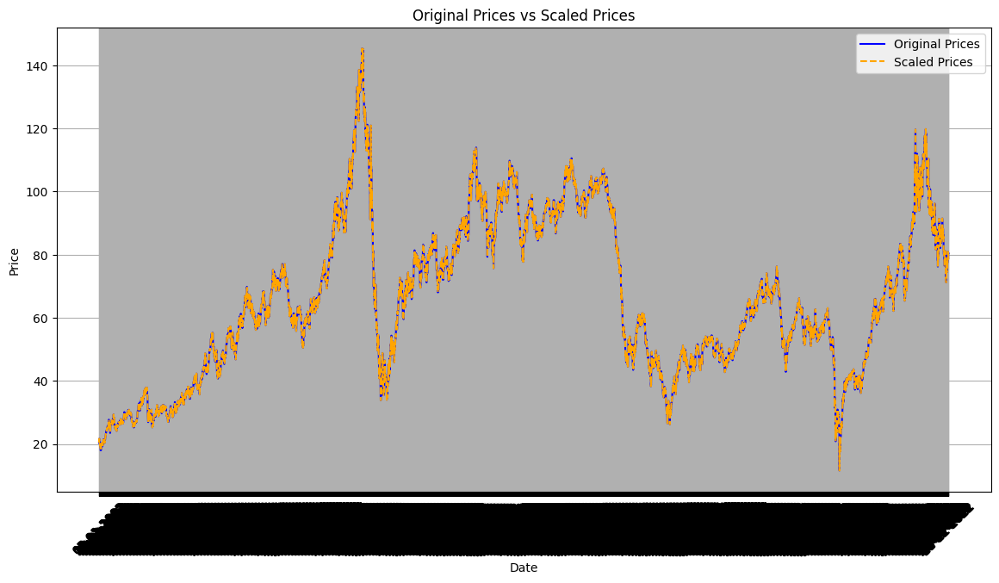

In [19]:
import matplotlib.pyplot as plt

# Extract the 'Price' column and normalize
data = df[['Price']]
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Inverse transform to get back to the original scale
scaled_back_prices = scaler.inverse_transform(scaled_data.reshape(-1, 1))

# Prepare dates for plotting
dates = df['Date']

# Plotting
plt.figure(figsize=(14, 7))

# Plot original prices
plt.plot(dates, data, color='blue', label='Original Prices')

# Plot normalized (scaled back) prices
plt.plot(dates, scaled_back_prices, color='orange', linestyle='--', label='Scaled Prices')

plt.title('Original Prices vs Scaled Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.show()


In [13]:
# Collect MSE and R2 scores for each model
models = ['Linear Regression', 'Random Forest', 'Gradient Boosting', 'ARIMA', 'LSTM']
mse_scores = [mean_squared_error(y_test, y_pred_lr), 
              mean_squared_error(y_test, y_pred_rf),
              mean_squared_error(y_test, y_pred_gb),
              mean_squared_error(y_test, y_pred_arima),
              mean_squared_error(y_test, y_pred_lstm)]

r2_scores = [r2_score(y_test, y_pred_lr), 
             r2_score(y_test, y_pred_rf),
             r2_score(y_test, y_pred_gb),
             r2_score(y_test, y_pred_arima),
             r2_score(y_test, y_pred_lstm)]

for model, mse, r2 in zip(models, mse_scores, r2_scores):
    print(f"{model}: MSE = {mse}, R² = {r2}")


Linear Regression: MSE = 5174.904021577175, R² = -11.098737757061203
Random Forest: MSE = 0.8352362037614086, R² = 0.9980472480740942
Gradient Boosting: MSE = 1.4407924938824068, R² = 0.9966314794490598
ARIMA: MSE = 692.1539295067661, R² = -0.6182307624846648
LSTM: MSE = 359.1193737228492, R² = 0.16039194001735324


Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


153/153 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - loss: 0.0289 - val_loss: 2.5399e-04
Epoch 2/100
153/153 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step - loss: 0.0020 - val_loss: 2.2072e-04
Epoch 3/100
153/153 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.0016 - val_loss: 2.5464e-04
Epoch 4/100
153/153 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 0.0013 - val_loss: 2.4675e-04
Epoch 5/100
153/153 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 0.0012 - val_loss: 1.9305e-04
Epoch 6/100
153/153 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - loss: 9.3523e-04 - val_loss: 1.7624e-04
Epoch 7/100
153/153 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 7.8787e-04 - val_loss: 3.4443e-04
Epoch 8/100
153/153 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 8.1318e-04 - val_loss: 1.6016e-04
Epoch 9/100
153/153 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 7.2002e-04 - val_loss: 1.5734e-04
Epoch 10/100
153/153 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 6.4855e-04 - val_loss: 1.6128e-04
Epoch 11/100
153/153 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - loss: 6.70

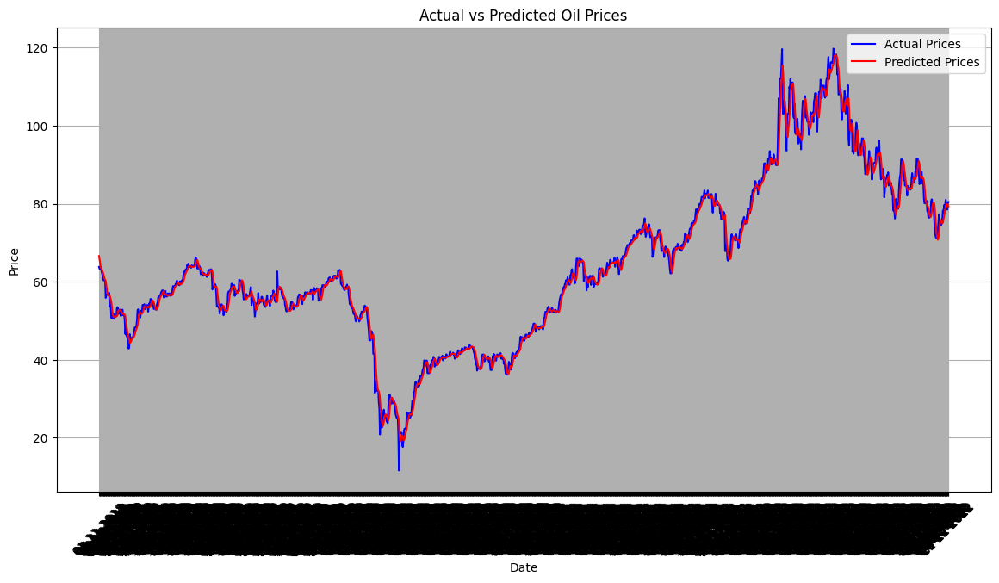

In [16]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Sample Data Preparation (assuming df is your dataframe and 'Date' and 'Price' are the columns)
data = df[['Price']]  # Adjust with all macroeconomic features + target
dates = df['Date']  # Extract the dates for future plotting

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Function to create sequences from time series data
def create_sequences(data, lookback):
    X, y = [], []
    for i in range(lookback, len(data)):
        X.append(data[i-lookback:i, 0])  # past 'lookback' days of data
        y.append(data[i, 0])  # target variable
    return np.array(X), np.array(y)

lookback = 60  # Number of time steps to look back
X, y = create_sequences(scaled_data, lookback)

# Reshape X to [samples, time steps, features]
X = np.reshape(X, (X.shape[0], X.shape[1], 1))

# Train/test split (80% training, 20% testing)
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Corresponding dates for test data
test_dates = dates[train_size + lookback:]

# Build LSTM Model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(Dropout(0.2))
model.add(LSTM(units=50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(units=25))
model.add(Dense(units=1))

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Early stopping to prevent overfitting
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, callbacks=[early_stop])

# Evaluate the model
train_loss = model.evaluate(X_train, y_train)
test_loss = model.evaluate(X_test, y_test)
print(f"Train Loss: {train_loss}, Test Loss: {test_loss}")

# Predictions
predicted_prices = model.predict(X_test)

# Invert scaling to get actual prices
predicted_prices = scaler.inverse_transform(predicted_prices.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

# Model Performance (MSE)
mse = mean_squared_error(y_test_actual, predicted_prices)
print(f"LSTM MSE: {mse}")

# Plotting actual vs predicted prices
plt.figure(figsize=(14,7))
plt.plot(test_dates, y_test_actual, color='blue', label='Actual Prices')
plt.plot(test_dates, predicted_prices, color='red', label='Predicted Prices')
plt.title('Actual vs Predicted Oil Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


In [16]:
pip install tcn

ERROR: Could not find a version that satisfies the requirement tcn (from versions: none)
ERROR: No matching distribution found for tcn
Note: you may need to restart the kernel to use updated packages.


In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense, Dropout, Conv1D, MaxPooling1D, Flatten, Reshape
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
#from tcn import TCN  # If you have installed the TCN library
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input


In [19]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Sample Data Preparation (assuming df is your dataframe and 'Price' is the target)
data = df[['Price']].values  # Adjust with all macroeconomic features + target

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Function to create sequences from time series data
def create_sequences(data, lookback):
    X, y = [], []
    for i in range(lookback, len(data)):
        X.append(data[i-lookback:i, 0])  # past 'lookback' days of data
        y.append(data[i, 0])  # target variable
    return np.array(X), np.array(y)

lookback = 60  # Number of time steps to look back
X, y = create_sequences(scaled_data, lookback)

# Reshape X to [samples, time steps, features]
X = np.reshape(X, (X.shape[0], X.shape[1], 1))

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Build GRU Model
model = Sequential()
model.add(GRU(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(Dropout(0.2))
model.add(GRU(units=50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(units=25))
model.add(Dense(units=1))

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Early stopping to prevent overfitting
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, callbacks=[early_stop])

# Evaluate the model
train_loss = model.evaluate(X_train, y_train)
test_loss = model.evaluate(X_test, y_test)
print(f"Train Loss: {train_loss}, Test Loss: {test_loss}")

# Predictions
predicted_prices = model.predict(X_test)

# Invert scaling to get actual prices
predicted_prices = scaler.inverse_transform(predicted_prices.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))




/opt/conda/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.0188 - val_loss: 1.7556e-04
Epoch 2/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.0020 - val_loss: 9.5090e-05
Epoch 3/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0014 - val_loss: 1.3508e-04
Epoch 4/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0010 - val_loss: 9.3300e-05
Epoch 5/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 9.0418e-04 - val_loss: 3.1195e-04
Epoch 6/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 7.4411e-04 - val_loss: 1.1628e-04
Epoch 7/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 6.1826e-04 - val_loss: 2.9169e-04
Epoch 8/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 5.6684e-04 - val_loss: 7.4227e-05
Epoch 9/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 5.8529e-04 - val_loss: 7.1456e-05
Epoch 10/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 5.0518e-04 - val_loss: 1.2580e-04
Epoch 11/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 10s

NameError: name 'mean_absolute_error' is not defined

GRU MSE: 3.5859657928548487
GRU MAE: 1.226693918728749
GRU RMSE: 1.8936646463550109
GRU MAPE: 0.020539066266825726
GRU R²: 0.9917679023396013


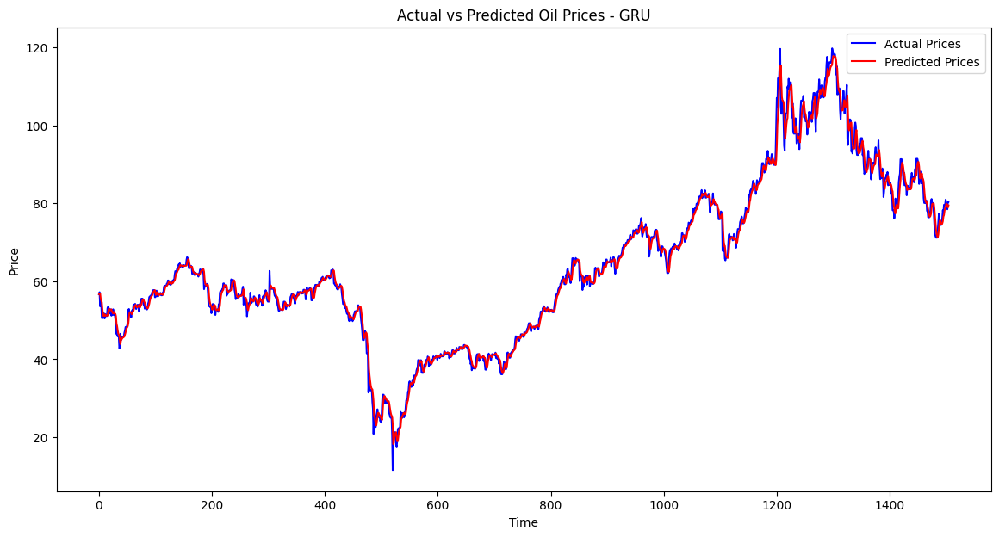

In [22]:
# Calculate Evaluation Metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
mse = mean_squared_error(y_test_actual, predicted_prices)
mae = mean_absolute_error(y_test_actual, predicted_prices)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test_actual, predicted_prices)
r2 = r2_score(y_test_actual, predicted_prices)

# Print Evaluation Metrics
print(f"GRU MSE: {mse}")
print(f"GRU MAE: {mae}")
print(f"GRU RMSE: {rmse}")
print(f"GRU MAPE: {mape}")
print(f"GRU R²: {r2}")

# Plotting actual vs predicted prices
plt.figure(figsize=(14,7))
plt.plot(y_test_actual, color='blue', label='Actual Prices')
plt.plot(predicted_prices, color='red', label='Predicted Prices')
plt.title('Actual vs Predicted Oil Prices - GRU')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

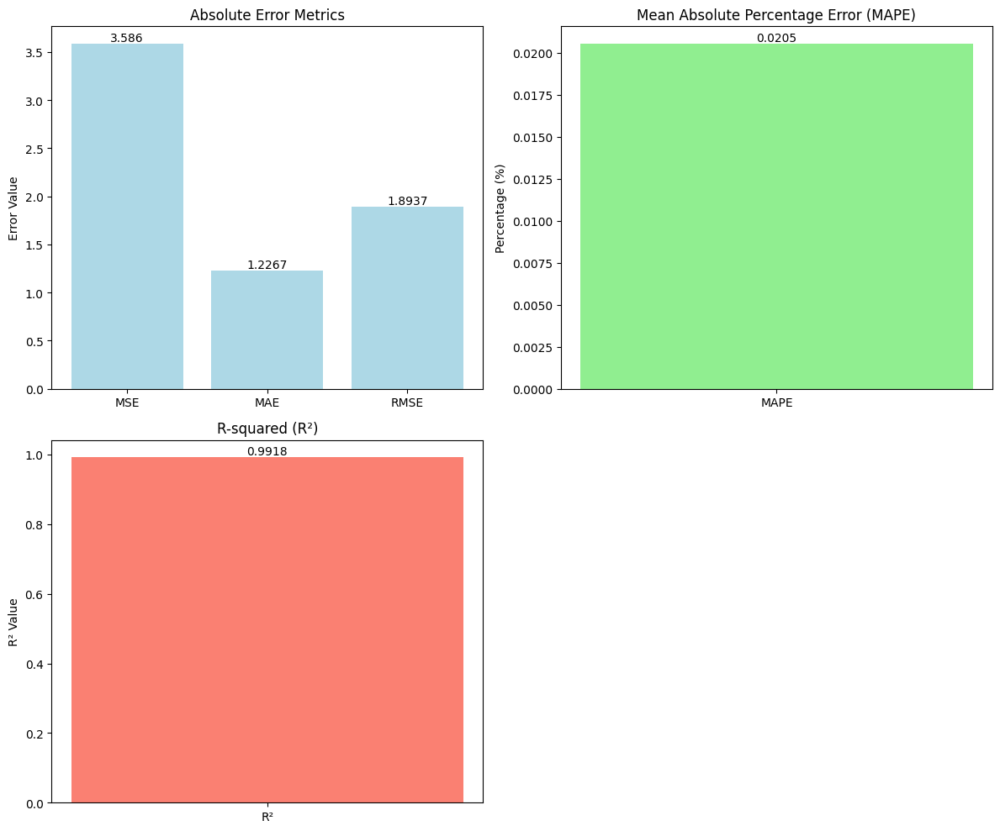

In [21]:
import matplotlib.pyplot as plt

# Define the metrics and values
metrics = ['MSE', 'MAE', 'RMSE', 'MAPE', 'R²']
values = [mse, mae, rmse, mape, r2]

# Create subplots for different types of metrics
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot Absolute Error Metrics (MSE, MAE, RMSE)
bars = axs[0, 0].bar(['MSE', 'MAE', 'RMSE'], [mse, mae, rmse], color='lightblue')
axs[0, 0].set_title('Absolute Error Metrics')
axs[0, 0].set_ylabel('Error Value')

# Add values inside the bars for Absolute Error Metrics
for bar in bars:
    yval = bar.get_height()
    axs[0, 0].text(bar.get_x() + bar.get_width()/2, yval, round(yval, 4), ha='center', va='bottom')

# Plot MAPE (Percentage Error)
bar_mape = axs[0, 1].bar(['MAPE'], [mape], color='lightgreen')
axs[0, 1].set_title('Mean Absolute Percentage Error (MAPE)')
axs[0, 1].set_ylabel('Percentage (%)')

# Add value inside the bar for MAPE
for bar in bar_mape:
    yval = bar.get_height()
    axs[0, 1].text(bar.get_x() + bar.get_width()/2, yval, round(yval, 4), ha='center', va='bottom')

# Plot R-squared (R²)
bar_r2 = axs[1, 0].bar(['R²'], [r2], color='salmon')
axs[1, 0].set_title('R-squared (R²)')
axs[1, 0].set_ylabel('R² Value')

# Add value inside the bar for R²
for bar in bar_r2:
    yval = bar.get_height()
    axs[1, 0].text(bar.get_x() + bar.get_width()/2, yval, round(yval, 4), ha='center', va='bottom')

# Hide the empty subplot
axs[1, 1].axis('off')

# Adjust layout for better visualization
plt.tight_layout()
plt.show()


In [23]:
pip install keras-tcn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 12.0 MB/s eta 0:00:0000:01
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.3.0
    Uninstalling typeguard-4.3.0:
      Successfully uninstalled typeguard-4.3.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.9.0 requires scipy<1.14,>=1.4.1, but you have scipy 1.14.0 which is incompatible.
ydata-profiling 4.9.0 requires typeguard<5,>=3, but you have typeguard 2.13.3 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


151/151 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.0183 - val_loss: 7.8727e-04
Epoch 2/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.0024 - val_loss: 3.8434e-04
Epoch 3/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.0021 - val_loss: 6.2604e-04
Epoch 4/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0015 - val_loss: 4.0422e-04
Epoch 5/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.0013 - val_loss: 3.4246e-04
Epoch 6/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.0011 - val_loss: 3.1488e-04
Epoch 7/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 9.8746e-04 - val_loss: 3.5026e-04
Epoch 8/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 9.0828e-04 - val_loss: 2.6019e-04
Epoch 9/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 8.5793e-04 - val_loss: 3.1464e-04
Epoch 10/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 8.8903e-04 - val_loss: 3.1430e-04
Epoch 11/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 8.1295e-04 -

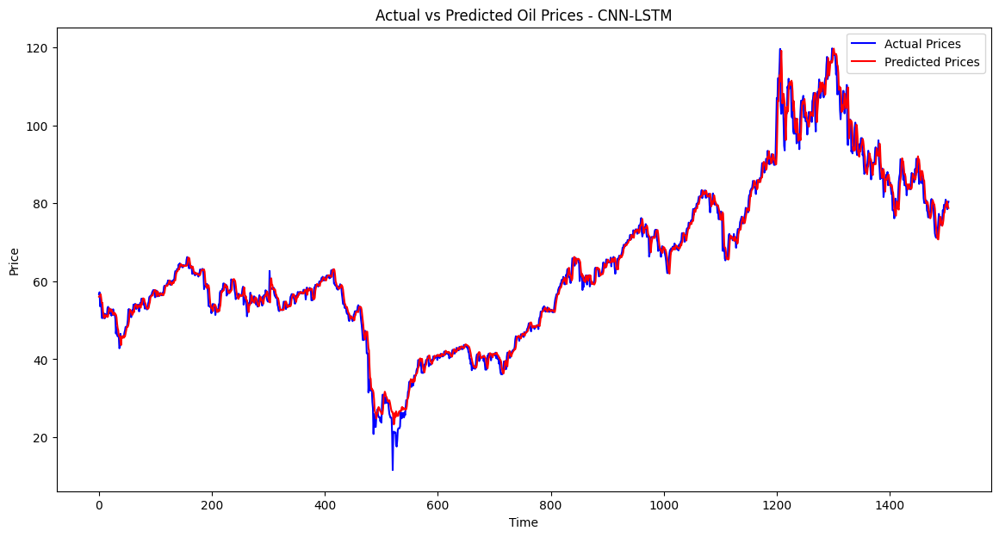

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error

# Sample Data Preparation (assuming df is your dataframe and 'Date' and 'Price' are the columns)
data = df[['Price']]  # Adjust with all macroeconomic features + target

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Function to create sequences from time series data
def create_sequences(data, lookback):
    X, y = [], []
    for i in range(lookback, len(data)):
        X.append(data[i-lookback:i, 0])  # past 'lookback' days of data
        y.append(data[i, 0])  # target variable
    return np.array(X), np.array(y)

lookback = 60  # Number of time steps to look back
X, y = create_sequences(scaled_data, lookback)

# Reshape X to [samples, time steps, features]
X = np.reshape(X, (X.shape[0], X.shape[1], 1))

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Build CNN-LSTM Model
model = Sequential()

# Adding CNN layers
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))

# Adding LSTM layers
model.add(LSTM(units=50, return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=50, return_sequences=False))
model.add(Dropout(0.2))

# Dense layers for output
model.add(Dense(units=25))
model.add(Dense(units=1))  # Ensure single output per sample

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Early stopping to prevent overfitting
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, callbacks=[early_stop])

# Evaluate the model
# Evaluate the model
train_loss = model.evaluate(X_train, y_train)
test_loss = model.evaluate(X_test, y_test)
print(f"Train Loss: {train_loss}, Test Loss: {test_loss}")

# Predictions
predicted_prices = model.predict(X_test)

# Invert scaling to get actual prices
predicted_prices = scaler.inverse_transform(predicted_prices.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calculate Evaluation Metrics
mse = mean_squared_error(y_test_actual, predicted_prices)
mae = mean_absolute_error(y_test_actual, predicted_prices)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test_actual, predicted_prices)
r2 = r2_score(y_test_actual, predicted_prices)

# Print Evaluation Metrics
print(f"GRU MSE: {mse}")
print(f"GRU MAE: {mae}")
print(f"GRU RMSE: {rmse}")
print(f"GRU MAPE: {mape}")
print(f"GRU R²: {r2}")

# Plotting actual vs predicted prices
plt.figure(figsize=(14,7))
plt.plot(y_test_actual, color='blue', label='Actual Prices')
plt.plot(predicted_prices, color='red', label='Predicted Prices')
plt.title('Actual vs Predicted Oil Prices - CNN-LSTM')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()


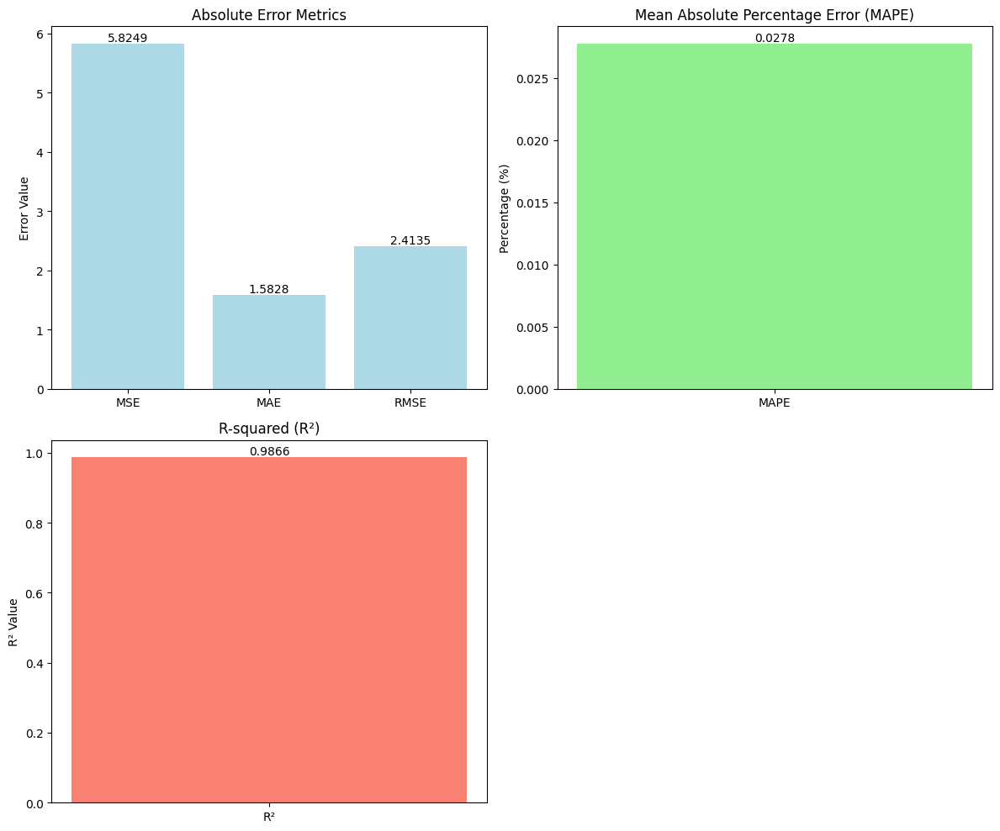

In [27]:
import matplotlib.pyplot as plt

# Define the metrics and values
metrics = ['MSE', 'MAE', 'RMSE', 'MAPE', 'R²']
values = [mse, mae, rmse, mape, r2]

# Create subplots for different types of metrics
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot Absolute Error Metrics (MSE, MAE, RMSE)
bars = axs[0, 0].bar(['MSE', 'MAE', 'RMSE'], [mse, mae, rmse], color='lightblue')
axs[0, 0].set_title('Absolute Error Metrics')
axs[0, 0].set_ylabel('Error Value')

# Add values inside the bars for Absolute Error Metrics
for bar in bars:
    yval = bar.get_height()
    axs[0, 0].text(bar.get_x() + bar.get_width()/2, yval, round(yval, 4), ha='center', va='bottom')

# Plot MAPE (Percentage Error)
bar_mape = axs[0, 1].bar(['MAPE'], [mape], color='lightgreen')
axs[0, 1].set_title('Mean Absolute Percentage Error (MAPE)')
axs[0, 1].set_ylabel('Percentage (%)')

# Add value inside the bar for MAPE
for bar in bar_mape:
    yval = bar.get_height()
    axs[0, 1].text(bar.get_x() + bar.get_width()/2, yval, round(yval, 4), ha='center', va='bottom')

# Plot R-squared (R²)
bar_r2 = axs[1, 0].bar(['R²'], [r2], color='salmon')
axs[1, 0].set_title('R-squared (R²)')
axs[1, 0].set_ylabel('R² Value')

# Add value inside the bar for R²
for bar in bar_r2:
    yval = bar.get_height()
    axs[1, 0].text(bar.get_x() + bar.get_width()/2, yval, round(yval, 4), ha='center', va='bottom')

# Hide the empty subplot
axs[1, 1].axis('off')

# Adjust layout for better visualization
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, ParameterGrid
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error


data = df[['Price']]  

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Function to create sequences from time series data
def create_sequences(data, lookback):
    X, y = [], []
    for i in range(lookback, len(data)):
        X.append(data[i-lookback:i, 0])  # past 'lookback' days of data
        y.append(data[i, 0])  # target variable
    return np.array(X), np.array(y)

lookback = 60  # Number of time steps to look back
X, y = create_sequences(scaled_data, lookback)

# Reshape X to [samples, time steps, features]
X = np.reshape(X, (X.shape[0], X.shape[1], 1))

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Define parameter grid for hyperparameter tuning
param_grid = {
    'units': [50, 100],
    'dropout_rate': [0.2, 0.3],
    'batch_size': [16, 32],
    'epochs': [50, 100]
}

# Perform hyperparameter tuning
results = []
for params in ParameterGrid(param_grid):
    # Build LSTM Model
    model = Sequential()
    model.add(LSTM(units=params['units'], return_sequences=True, input_shape=(X_train.shape[1], 1)))
    model.add(Dropout(params['dropout_rate']))
    model.add(LSTM(units=params['units'], return_sequences=False))
    model.add(Dropout(params['dropout_rate']))
    model.add(Dense(units=25))
    model.add(Dense(units=1))

    # Compile the model
    optimizer = Adam(learning_rate=0.001)
    model.compile(optimizer=optimizer, loss='mean_squared_error')

    # Early stopping to prevent overfitting
    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Train the model
    history = model.fit(X_train, y_train, epochs=params['epochs'], batch_size=params['batch_size'],
                        validation_split=0.2, callbacks=[early_stop], verbose=0)

    # Evaluate the model
    test_loss = model.evaluate(X_test, y_test, verbose=0)
    results.append({**params, 'test_loss': test_loss})

# Convert results to DataFrame
results_df = pd.DataFrame(results)
print(results_df)

# Choose the best model based on results (you can adjust this based on the best test_loss)
best_params = results_df.loc[results_df['test_loss'].idxmin()]
print(f"Best parameters: {best_params}")

# Build the best model
best_model = Sequential()
best_model.add(LSTM(units=best_params['units'], return_sequences=True, input_shape=(X_train.shape[1], 1)))
best_model.add(Dropout(best_params['dropout_rate']))
best_model.add(LSTM(units=best_params['units'], return_sequences=False))
best_model.add(Dropout(best_params['dropout_rate']))
best_model.add(Dense(units=25))
best_model.add(Dense(units=1))

# Compile the model
optimizer = Adam(learning_rate=0.001)
best_model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the best model
history = best_model.fit(X_train, y_train, epochs=best_params['epochs'], batch_size=best_params['batch_size'],
                         validation_split=0.2, callbacks=[early_stop])

# Evaluate the best model
train_loss = best_model.evaluate(X_train, y_train)
test_loss = best_model.evaluate(X_test, y_test)
print(f"Train Loss: {train_loss}, Test Loss: {test_loss}")

# Predictions
predicted_prices = best_model.predict(X_test)

# Invert scaling to get actual prices
predicted_prices = scaler.inverse_transform(predicted_prices.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

# Model Performance Metrics
mse = mean_squared_error(y_test_actual, predicted_prices)
mae = mean_absolute_error(y_test_actual, predicted_prices)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_actual, predicted_prices)
mape = mean_absolute_percentage_error(y_test_actual, predicted_prices)

print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")
print(f"MAPE: {mape}")

# Plotting
fig, ax = plt.subplots(2, 2, figsize=(14, 10))

# Actual vs Predicted Prices
ax[0, 0].plot(y_test_actual, color='blue', label='Actual Prices')
ax[0, 0].plot(predicted_prices, color='red', label='Predicted Prices')
ax[0, 0].set_title('Actual vs Predicted Prices')
ax[0, 0].set_xlabel('Time')
ax[0, 0].set_ylabel('Price')
ax[0, 0].legend()

# Training and Validation Loss
ax[0, 1].plot(history.history['loss'], label='Training Loss')
ax[0, 1].plot(history.history['val_loss'], label='Validation Loss')
ax[0, 1].set_title('Training and Validation Loss')
ax[0, 1].set_xlabel('Epochs')
ax[0, 1].set_ylabel('Loss')
ax[0, 1].legend()

# Residuals
residuals = y_test_actual - predicted_prices
ax[1, 0].hist(residuals, bins=50)
ax[1, 0].set_title('Residuals Histogram')
ax[1, 0].set_xlabel('Residual')
ax[1, 0].set_ylabel('Frequency')

# Error vs Time
ax[1, 1].plot(residuals, color='green')
ax[1, 1].set_title('Error vs Time')
ax[1, 1].set_xlabel('Time')
ax[1, 1].set_ylabel('Error')

plt.tight_layout()
plt.show()


/opt/conda/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


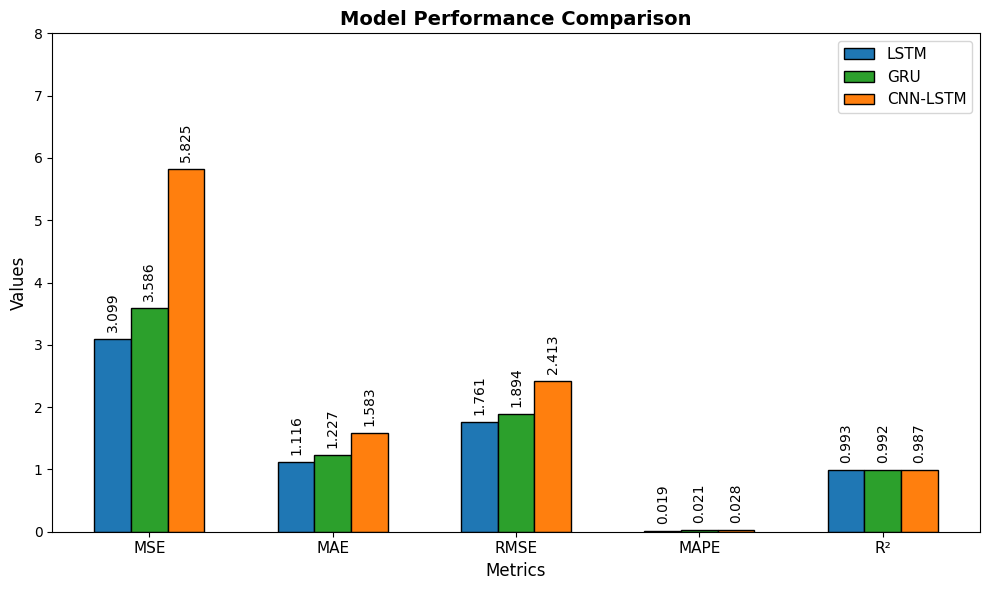

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# Performance metrics for each model
metrics = ['MSE', 'MAE', 'RMSE', 'MAPE', 'R²']

# Values for LSTM, GRU, and CNN-LSTM
lstm_values = [3.0995, 1.1159, 1.7606, 0.01898, 0.9929]
gru_values = [3.5860, 1.2267, 1.8937, 0.02054, 0.9918]
cnn_lstm_values = [5.8249, 1.5828, 2.4135, 0.02776, 0.9866]

# Bar width and positions
bar_width = 0.2
index = np.arange(len(metrics))

# Create the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Bar plots with spaced bars for readability
rects1 = ax.bar(index - bar_width, lstm_values, bar_width, label='LSTM', color='#1f77b4', edgecolor='black')
rects2 = ax.bar(index, gru_values, bar_width, label='GRU', color='#2ca02c', edgecolor='black')
rects3 = ax.bar(index + bar_width, cnn_lstm_values, bar_width, label='CNN-LSTM', color='#ff7f0e', edgecolor='black')

# Add labels, title, and legend
ax.set_xlabel('Metrics', fontsize=12)
ax.set_ylabel('Values', fontsize=12)
ax.set_title('Model Performance Comparison', fontsize=14, fontweight='bold')
ax.set_xticks(index)
ax.set_xticklabels(metrics, fontsize=11)
ax.legend(fontsize=11)

# Set y-axis limits to provide space for labels
ax.set_ylim(0, 8)  # Increase limit to ensure all labels fit

# Display the values on top of the bars with three decimal places
def autolabel(rects):
    """Attach a text label on top of each bar displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.3f}', 
                    xy=(rect.get_x() + rect.get_width() / 2, height),  # Place number above the bar
                    xytext=(0, 5),  # Adjust vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=10, color='black', rotation=90)

# Apply the autolabel function to all sets of bars
autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

# Adjust layout for a cleaner look
plt.tight_layout()

# Show the plot
plt.show()
